<a href="https://colab.research.google.com/github/Jeeeeeeeee/Study/blob/main/TPS08_XGBoost%2C%20Optuna.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install optuna

     |████████████████████████████████| 302 kB 5.0 MB/s 
     |████████████████████████████████| 80 kB 7.7 MB/s 
     |████████████████████████████████| 164 kB 34.7 MB/s 
     |████████████████████████████████| 75 kB 4.0 MB/s 
     |████████████████████████████████| 49 kB 5.6 MB/s 
     |████████████████████████████████| 141 kB 51.3 MB/s 
     |████████████████████████████████| 111 kB 50.3 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11136 sha256=50cab8970b74196d712631d0fc41e887fe1e56e83dee72a8f729d05262a97889
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [ ]:
import numpy as np 
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


from xgboost import XGBRegressor
import xgboost as xgb

from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
import sklearn.metrics as metrics

import optuna
from optuna import Trial, visualization

In [ ]:
from google.colab import drive
drive.mount('/content/mydrive/')

Mounted at /content/mydrive/


In [ ]:
train_path = '/content/mydrive/MyDrive/DATA/train.csv'
test_path = '/content/mydrive/MyDrive/DATA/test.csv'

train = pd.read_csv(train_path)
test = pd.read_csv(test_path)

In [ ]:
target = train['loss']

train.drop(columns = ['id', 'loss'], inplace = True)
test.drop(columns = 'id', inplace=True)

In [ ]:
train.head()

,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,...,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99
0,-0.002350,59,0.766739,-1.350460,42.2727,16.68570,30.3599,1.267300,0.392007,1.09101,1.96874,1.874640,117.286,6.716200,0.985656,0.973428,4004232,0.377896,1.033820,0.574531,0.122371,8.18617,1517.830,3.13219,0.112836,5.01868,116.766,10891,8.19366,5.79715,1.09999,14.86840,-0.275434,0.915721,167.800,-7.534140,4.23632,1.629560,1.144400,-0.303139,...,8.575340e+09,70.9733,0.380057,0.031812,1.09527,0.563482,0.122689,1.160720,1.69391,1.07217,65.1543,0.022504,-5.6068,1.798660,0.528068,6696.300,-0.562078,1.301020,6.71624,1.143470,2.29983,0.010485,-0.127223,0.231086,4.51614,0.594494,397,0.264022,8.68790,15.070100,0.376622,-42.43990,26.854000,1.45751,0.696161,0.941764,1.828470,0.924090,2.29658,10.48980
1,0.784462,145,-0.463845,-0.530421,27324.9000,3.47545,160.4980,0.828007,3.735860,1.28138,-2.73947,-0.529506,157.670,0.696384,1.441230,0.159056,23567462,-0.089583,-0.711628,-1.045860,0.139920,3.69294,-123.354,7.74097,-0.852302,8.51025,161.175,87801,12.02020,1.78393,1.23100,10.14970,-0.018724,1.011280,127.401,11.821400,5.99681,-0.953850,1.379370,1.079530,...,4.518200e+09,75.5602,1.987990,0.318177,1.14901,0.723574,0.184821,-0.348303,-7.17633,1.46258,43.1121,-0.060801,64.0455,2.358450,5.759690,3958.140,1.576610,-1.241790,5.91412,0.959826,2.56631,0.000652,-0.335617,-0.271723,5.10319,8.706220,98,0.210513,7.86416,3.371900,0.147973,-184.13200,7.901370,1.70644,-0.494699,-2.058300,0.819184,0.439152,2.36470,1.14383
2,0.317816,19,-0.432571,-0.382644,1383.2600,19.71290,31.1026,-0.515354,34.430800,1.24210,2.90180,-0.960340,118.590,7.696420,1.488760,0.387277,235760,0.055568,0.268560,0.718133,0.027133,11.67340,270.247,3.44051,-0.679071,13.37810,150.362,14173,1.69954,7.04728,1.10513,7.62871,0.685721,0.809485,120.064,194.427000,6.77866,0.634136,0.934386,0.926980,...,8.444970e+08,99.4933,5.098040,0.258909,1.16878,0.049053,0.173547,0.937000,2.05947,1.22245,50.2267,-0.026215,71.6849,2.434170,1.904560,27165.800,-0.773223,-1.833390,4.98548,1.170870,1.17201,0.016848,-0.235581,-0.724935,3.22565,4.170990,105,-0.155451,8.91829,0.186334,0.335985,7.43721,37.218100,3.25339,0.337934,0.615037,2.216760,0.745268,1.69679,12.30550
3,0.210753,17,-0.616454,0.946362,-119.2530,4.08235,185.2570,1.383310,-47.521400,1.09130,-1.51200,-1.292340,125.461,7.343230,-3.092390,0.713795,1146032,0.326534,0.454842,0.219958,0.037982,5.15195,4893.860,6.89751,-0.830552,4.43184,132.855,77147,32.80900,4.06390,1.11911,3.91776,0.500353,0.206448,120.411,233.537000,7.75131,0.625762,-1.940810,1.333210,...,3.543970e+09,60.8082,2.357590,0.239080,1.16116,0.535797,0.222185,1.163120,2.36343,1.41530,116.1820,0.018674,55.4428,2.228240,4.303600,2643.760,-1.666320,0.792398,6.45162,1.077330,2.90676,0.023735,-0.091992,-0.098701,4.27820,5.347530,512,0.855981,8.27663,4.066650,0.336490,9.66778,0.626942,1.49425,0.517513,-10.222100,2.627310,0.617270,1.45645,10.02880
4,0.439671,20,0.968126,-0.092546,74.3020,12.30650,72.1860,-0.233964,24.399100,1.10151,1.77348,-0.546781,147.186,17.394300,0.964678,0.964894,19272478,0.121071,0.422461,-0.103100,-0.000910,8.14191,162.713,1.56561,-0.300743,7.56458,160.995,5780,-1.54254,8.09081,1.60582,7.04632,-1.056850,1.727440,126.848,0.910761,6.08868,0.150619,1.134610,1.553550,...,6.379450e+09,103.9900,4.396300,0.248451,1.18082,0.546460,0.140713,0.804404,7.55191,-2.50995,68.2459,0.001230,47.2885,0.461938,1.072440,703.401,0.691108,5.014080,6.06393,1.120250,1.73348,-0.001272,-0.333872,-0.063781,1.11420,5.233990,109,-0.158318,5.43062,0.991616,0.528518,290.65700,15.604300,1.73557,-0.476668,1.390190,2.195740,0.826987,1.78485,7.07197


In [ ]:
kf = KFold(n_splits = 5, random_state = 42, shuffle = True)

for i, (trn, val) in enumerate(kf.split(train)):
  train.loc[val, 'kfold'] = i
train['kfold'] = train['kfold'].astype(int)

In [ ]:
train['kfold']

0         1
1         1
2         3
3         2
4         0
         ..
249995    4
249996    2
249997    0
249998    1
249999    1
Name: kfold, Length: 250000, dtype: int64

In [ ]:
feature_cols = [col for col in test.columns.tolist()]

In [ ]:
target = train['loss']
train.drop('loss',axis = 1,inplace = True)

In [ ]:
def fit_xgb(trial, xtr, ytr, xval, yval):
    params = {
        "n_estimators": trial.suggest_int("n_estimators",20,100),
        "subsample": trial.suggest_uniform("subsample", 0.5,0.9),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.5,0.9),
        "eta": trial.suggest_uniform("eta",0.01,0.2),
        "max_depth": trial.suggest_int("max_depth",3,20),
        "reg_alpha": trial.suggest_int("reg_alpha",1,50),
        'tree_method': 'gpu_hist'
    }
    
    model = xgb.XGBRegressor(**params, random_state = 42, eval_metric="rmse")
    model.fit(xtr, ytr.reshape(-1,))
    
    y_tr_pred = model.predict(xtr)
    y_val_pred = model.predict(xval)
    
    y_tr_pred = np.clip(y_tr_pred, 0.1, None)
    y_val_pred = np.clip(y_val_pred, 0.1, None)
    
    log = {
        "train rmse": np.sqrt(mean_squared_error(ytr, y_tr_pred)),
        "val rmse": np.sqrt(mean_squared_error(yval, y_val_pred))
    }
    
    return model, log

In [ ]:
def objective(trial):
    rmse = 0
    for fold in range(5):
        trn_idx = train['kfold'] != fold
        val_idx = train['kfold'] == fold
        trn = train.loc[trn_idx, :]
        val = train.loc[val_idx, :]

        xtr, ytr = trn[feature_cols].values, target.loc[trn_idx].values
        xval, yval = val[feature_cols].values, target.loc[val_idx].values
        
        model, log = fit_xgb(trial, xtr, ytr, xval, yval)
        rmse += log['val rmse']/5
        
    return rmse

In [ ]:
study = optuna.create_study(direction = "minimize", study_name = 'pérdida')
study.optimize(objective, n_trials = 10)

[I 2021-08-15 07:52:05,434] A new study created in memory with name: pérdida


[07:52:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:52:15,324] Trial 0 finished with value: 7.876165998840678 and parameters: {'n_estimators': 80, 'subsample': 0.6513377842573997, 'colsample_bytree': 0.7458145603754442, 'eta': 0.03055376893740564, 'max_depth': 7, 'reg_alpha': 43}. Best is trial 0 with value: 7.876165998840678.


[07:52:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:52:31,905] Trial 1 finished with value: 7.892087236344258 and parameters: {'n_estimators': 100, 'subsample': 0.7250260135711035, 'colsample_bytree': 0.6835292431706799, 'eta': 0.15415038601742076, 'max_depth': 9, 'reg_alpha': 36}. Best is trial 0 with value: 7.876165998840678.


[07:52:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:52:37,227] Trial 2 finished with value: 7.907982876890113 and parameters: {'n_estimators': 27, 'subsample': 0.5609095700226401, 'colsample_bytree': 0.7325138820246808, 'eta': 0.025917254261740692, 'max_depth': 6, 'reg_alpha': 43}. Best is trial 0 with value: 7.876165998840678.


[07:52:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:52:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:53:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:53:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:53:15,399] Trial 3 finished with value: 7.9381976016066265 and parameters: {'n_estimators': 41, 'subsample': 0.8169927066866935, 'colsample_bytree': 0.5949054765892725, 'eta': 0.032981992904351755, 'max_depth': 15, 'reg_alpha': 30}. Best is trial 0 with value: 7.876165998840678.


[07:53:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:53:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:53:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:53:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:53:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:53:59,297] Trial 4 finished with value: 7.993044837911058 and parameters: {'n_estimators': 42, 'subsample': 0.5024117963578578, 'colsample_bytree': 0.8964187200521945, 'eta': 0.08111071112618183, 'max_depth': 16, 'reg_alpha': 36}. Best is trial 0 with value: 7.876165998840678.


[07:53:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:54:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:54:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:54:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:54:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:54:06,011] Trial 5 finished with value: 7.896579640641523 and parameters: {'n_estimators': 31, 'subsample': 0.8531194359240735, 'colsample_bytree': 0.8202765606780562, 'eta': 0.131254004050019, 'max_depth': 8, 'reg_alpha': 42}. Best is trial 0 with value: 7.876165998840678.


[07:54:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:54:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:54:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:55:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:55:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:56:16,016] Trial 6 finished with value: 8.102841339208224 and parameters: {'n_estimators': 47, 'subsample': 0.534005225637227, 'colsample_bytree': 0.8836486662235141, 'eta': 0.02640075783794913, 'max_depth': 20, 'reg_alpha': 10}. Best is trial 0 with value: 7.876165998840678.


[07:56:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:56:40,604] Trial 7 finished with value: 7.929614570780124 and parameters: {'n_estimators': 47, 'subsample': 0.6091524912123379, 'colsample_bytree': 0.7421505845066096, 'eta': 0.03315620105668762, 'max_depth': 13, 'reg_alpha': 37}. Best is trial 0 with value: 7.876165998840678.


[07:56:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:56:48,678] Trial 8 finished with value: 7.870857497182282 and parameters: {'n_estimators': 84, 'subsample': 0.8358831311719631, 'colsample_bytree': 0.7139685983484924, 'eta': 0.06998271303047134, 'max_depth': 6, 'reg_alpha': 16}. Best is trial 8 with value: 7.870857497182282.


[07:56:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:56:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[I 2021-08-15 07:56:59,372] Trial 9 finished with value: 7.888247334734172 and parameters: {'n_estimators': 79, 'subsample': 0.5370996874479345, 'colsample_bytree': 0.5449866344716046, 'eta': 0.027077238287384217, 'max_depth': 8, 'reg_alpha': 18}. Best is trial 8 with value: 7.870857497182282.


In [ ]:
study.best_params

{'colsample_bytree': 0.7139685983484924,
 'eta': 0.06998271303047134,
 'max_depth': 6,
 'n_estimators': 84,
 'reg_alpha': 16,
 'subsample': 0.8358831311719631}

In [ ]:
clf = xgb.XGBRegressor(**(study.best_params))
clf.fit(train[feature_cols], target, eval_metric="rmse")

[07:57:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7139685983484924,
             eta=0.06998271303047134, gamma=0, importance_type='gain',
             learning_rate=0.1, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=None, n_estimators=84, n_jobs=1,
             nthread=None, objective='reg:linear', random_state=0, reg_alpha=16,
             reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
             subsample=0.8358831311719631, verbosity=1)

In [ ]:
predictions = clf.predict(test[feature_cols])

In [ ]:
sample_submission = pd.read_csv('/content/mydrive/MyDrive/DATA/sample_submission.csv')

In [ ]:
submission = pd.DataFrame({
    'id': np.asarray(sample_submission.id), 
    'loss': predictions.astype(int)
})

submission.to_csv('my_submission.csv', index = False)

# EDA

In [ ]:
train.drop(columns = 'kfold', inplace = True)

In [ ]:
train.columns

Index(['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10',
       'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20',
       'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30',
       'f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39', 'f40',
       'f41', 'f42', 'f43', 'f44', 'f45', 'f46', 'f47', 'f48', 'f49', 'f50',
       'f51', 'f52', 'f53', 'f54', 'f55', 'f56', 'f57', 'f58', 'f59', 'f60',
       'f61', 'f62', 'f63', 'f64', 'f65', 'f66', 'f67', 'f68', 'f69', 'f70',
       'f71', 'f72', 'f73', 'f74', 'f75', 'f76', 'f77', 'f78', 'f79', 'f80',
       'f81', 'f82', 'f83', 'f84', 'f85', 'f86', 'f87', 'f88', 'f89', 'f90',
       'f91', 'f92', 'f93', 'f94', 'f95', 'f96', 'f97', 'f98', 'f99'],
      dtype='object')

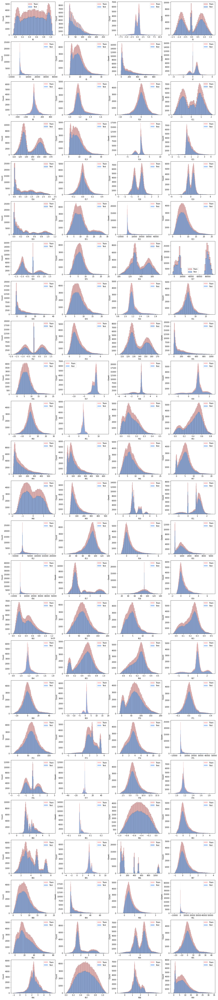

In [ ]:
columns = train.columns[:]
plt.subplots(figsize = (20, 200))
length = len(columns)

for i, j in zip(columns, range(length)):
  fig = plt.subplot((length/2), 4, j+1)
  # plt.subplots_adjust(wspace =2, hspace=5)
  sns.histplot(x = train[i], color = '#FFB9B9', edgecolor = 'black')
  sns.histplot(x = test[i], color = '#8BBDFF', edgecolor = 'black')
  fig.legend(labels = ('Train', 'Test'))

  ########### shape:###########
  # Skewed : f1, f4, f6, f15, f16, f20, f21, f22, f28, f30, f33, f35, f38, f39, f42, f43, f44, f49, f54, f55*, f57, f58, f59, f87, f88, f89, f90, f91, f92, f93, f98
  # Bimodal : f2, f12, f14, f18, f19, f24, f26, f27, f34, f45, f47, f65, f77, f81, f85, f94, f99
  # multimodal : f3, f7, f11, f32, f50, f51, f76, f80, f84, f86

In [ ]:
  ########### shape:###########
  # Skewed : f1, f4, f6, f15, f16, f20, f21, f22, f28, f30, f33, f35, f38, f39, f42, f43, f44, f49, f54, f55*, f57, f58, f59, f87, f88, f89, f90, f91, f92, f93, f98
  # Bimodal : f2, f12, f14, f18, f19, f24, f26, f27, f34, f45, f47, f65, f77, f81, f85, f94, f99
  # multimodal : f3, f7, f11, f32, f50, f51, f76, f80, f84, f86

In [ ]:
# 1회차
# standard Scaling 

# 2회차
# skewed -> log transformation
# bimodal, multimodal -> quantile transformation
# others -> standard scaling

In [ ]:
# StandardScaling
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_train = pd.DataFrame(scaler.fit_transform(train))
scaled_test = pd.DataFrame(scaler.fit_transform(test))

In [ ]:
scaled_train

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100
0,-1.668045,0.179768,0.498854,-1.767452,-0.585085,1.548611,-0.731714,1.096083,-0.163171,-0.996718,0.782926,1.901565,-1.349324,-0.240301,0.228958,0.352071,-0.574322,3.559348,1.448443,0.676341,-0.588994,-0.307815,-0.332485,-1.144582,0.832449,-0.324082,-1.328327,-1.008880,0.353049,-0.394599,-0.788837,3.429850,-0.326372,-0.593832,2.090282,-0.900075,-0.579987,0.851755,0.358781,-1.835619,...,0.076154,-1.473564,-1.793635,-0.990275,0.406898,-0.950745,0.301738,0.002494,0.053999,-0.097213,0.114168,-2.243428,-0.599415,-1.533170,0.281431,-0.479637,0.169513,0.148792,-0.409821,0.473223,-0.157583,1.439166,-0.020583,0.391270,-3.493042,0.424413,0.008044,0.414765,0.642463,-0.459258,-0.576275,0.287884,-0.636568,1.048811,-0.066279,-0.659995,1.706200,1.113531,0.432237,1.030971
1,0.887510,2.208234,-0.431857,-0.732528,3.907814,-0.863906,-0.021877,0.556142,-0.129652,0.912720,-1.152000,-0.667618,1.450830,-1.337251,0.510317,-0.948488,1.724813,-0.959092,-1.099753,-1.514196,-0.537041,-1.101474,-0.591800,0.087540,-0.522160,0.776365,1.498325,1.126731,0.848939,-1.560149,0.182703,1.504821,-0.000298,-0.507688,-0.636414,-0.803858,-0.081314,-0.642712,0.490101,0.368908,...,0.204799,-0.921589,1.019730,-0.452779,1.141036,-0.319081,-1.757815,-0.868864,0.190750,-0.663265,-0.810558,-0.021187,0.162050,1.169480,-0.058704,2.065565,-0.590877,-0.248964,-2.217162,0.859756,-0.543151,0.525436,-0.738237,0.759880,3.951699,-0.457665,-0.067977,0.192026,-0.385649,-0.973052,-0.592941,-0.988442,-0.360043,-0.977224,-0.390478,-1.790770,-0.433968,1.218930,-1.222692,-0.480333
2,-0.628150,-0.763705,-0.408204,-0.546028,-0.364251,2.101452,-0.727663,-1.095000,0.178041,0.518736,1.166385,-1.128027,-1.258907,-0.061682,0.539671,-0.584017,-1.017206,0.443869,0.331233,0.870471,-0.870936,0.308150,-0.529609,-1.062155,-0.279024,2.310577,0.810073,-0.917746,-0.488540,-0.031527,-0.750720,0.476364,0.894493,-0.689602,-1.131618,0.103878,0.140152,0.275916,0.241409,0.125682,...,0.876031,0.146038,0.437457,-0.255044,-1.952134,-0.433698,-0.003601,0.038404,0.106638,-0.480560,-0.426642,0.222546,0.265049,-0.822076,2.824158,-0.730916,-0.767786,-0.709458,-0.140163,-1.162697,0.091897,0.964057,-1.385102,-0.419031,-0.210623,-0.437014,-0.587906,0.477063,-0.665616,-0.550573,-0.570408,0.985834,1.358390,0.439352,-0.101587,-0.224966,0.917008,0.185501,0.753750,-0.102507
3,-0.975889,-0.810879,-0.547278,1.131234,-0.611685,-0.753071,0.113171,1.238672,-0.643465,-0.993810,-0.647549,-1.482818,-0.782484,-0.126042,-2.289616,-0.062565,-0.910228,3.062906,0.603187,0.197009,-0.838819,-0.843763,0.200946,-0.137953,-0.491633,-0.509037,-0.304255,0.830895,3.543009,-0.897983,-0.647048,-1.037546,0.659037,-1.233230,-1.108198,0.298294,0.415663,0.271072,-1.365481,0.773375,...,-0.208938,-0.794712,0.242648,-0.331257,0.279942,0.060780,0.305013,0.068263,0.174189,1.213197,0.071650,-0.295654,-0.015071,0.417266,-0.221977,-1.793769,0.017417,0.017572,-1.060741,1.353584,0.361951,1.593641,-0.491284,0.241867,0.869176,0.763674,0.849048,0.303558,-0.324590,-0.549438,-0.570146,-1.478323,-0.595755,0.744873,-1.272692,0.235002,0.352117,-0.186368,0.350606,-0.606275
4,-0.232366,-0.740119,0.651167,-0.179911,-0.579810,0.748861,-0.503574,-0.749140,0.077481,-0.891402,0.702681,-0.686079,0.723888,1.705497,0.216002,0.338443,1.220053,1.076992,0.555914,-0.239719,-0.953955,-0.315633,-0.546600,-1.563395,0.251974,0.478316,1.486868,-1.150801,-0.908688,0.271543,2.962284,0.238774,-1.318932,0.137918,-0.673738,-0.858095,-0.055291,-0.003792,0.353310,1.124685,...,1.002146,-0.094858,0.334713,-0.134622,0.328840,-0.767504,-0.184571,0.577947,-1.200729,-0.017820,-0.121982,-0.555815,-2.417717,-1.251948,-0.463008,1.011750,1.279849,-0.174676,-0.638342,-0.348276,-0.618582,0.533087,-0.441444,-1.744815,0.764972,-0.425214,-0.591980,-0.466003,-0.594843,-0.117935,-0.

In [ ]:
X = scaled_train
X_test = scaled_test

# Rough하게 Pycaret

In [ ]:
!pip install pycaret[full]

     |████████████████████████████████| 264 kB 5.0 MB/s 
     |████████████████████████████████| 1.3 MB 36.7 MB/s 
     |████████████████████████████████| 105 kB 48.3 MB/s 
     |████████████████████████████████| 14.4 MB 23.9 MB/s 
     |████████████████████████████████| 248 kB 54.4 MB/s 
     |████████████████████████████████| 167 kB 54.9 MB/s 
     |████████████████████████████████| 271 kB 53.3 MB/s 
     |████████████████████████████████| 1.7 MB 45.1 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 6.8 MB 38.2 MB/s 
     |████████████████████████████████| 80 kB 5.4 MB/s 
     |████████████████████████████████| 56 kB 4.4 MB/s 
     |████████████████████████████████| 2.0 MB 42.2 MB/s 
     |████████████████████████████████| 101 kB 9.6 MB/s 
     |████████████████████████████████| 131 kB 50.8 MB/s 
     |██████████████████

# XGBOOST

In [ ]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import random
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import optuna
import os

In [ ]:
def train_model_optuna(trial, X_train, X_valid, y_train, y_valid):
  preds = 0

  xgb_params = {
                 "n_estimators": trial.suggest_categorical('n_estimators', [10000]),
                 "learning_rate": trial.suggest_float('learning_rate', 0.01, 0.8),
                 "subsample": trial.suggest_float('subsample', 0.5, 0.95),
                 "colsample_bytree": trial.suggest_float('colsample_bytree', 0.5, 0.95),
                 "max_depth": trial.suggest_int("max_depth", 5, 16),
                 "booster": trial.suggest_categorical('booster', ["gbtree"]),
                 "tree_method": trial.suggest_categorical('tree_method', ["gpu_hist"]),
                 "reg_lambda": trial.suggest_float('reg_lambda', 2, 100),
                 "reg_alpha": trial.suggest_float('reg_alpha', 1, 50),
                 "random_state": trial.suggest_categorical('random_state', [42]),
                 "n_jobs": trial.suggest_categorical('n_jobs', [4]),
  }

  #Model loading and training
  model = XGBRegressor(**xgb_params)
  model.fit(X_train, y_train,
            eval_set = [(X_train, y_train), (X_valid, y_valid)],
            eval_metric = "rmse",
            early_stopping_rounds = 100,
            verbose = True)
  
  print(f"Number of boosting rounds : {model.best_iteration}")
  oof = model.predict(X_valid)
  oof[oof < 0] = 0

  return np.sqrt(mean_squared_error(y_valid, oof))

In [ ]:
y = pd.DataFrame(target)

In [ ]:
# split data
split = StratifiedShuffleSplit(n_splits = 1, test_size = 0.2, random_state = 42)
for train_idx, valid_idx in split.split(X, target.values):
  X_train, X_valid = X.loc[train_idx], X.loc[valid_idx]
  y_train, y_valid = y.loc[train_idx], y.loc[valid_idx]

study = optuna.create_study(direction = 'minimize')
study.optimize(lambda trial: train_model_optuna(trial, X_train, X_valid,
                                                y_train, y_valid),
               n_trials = 100,
               )

# SHOW IT
print("Number of finished trials :", len(study.trials))
print("Best trial parameters :", study.best_trial.params)
print('Best Score :', study.best_value)

[I 2021-08-15 11:59:09,406] A new study created in memory with name: no-name-e054079a-2654-4fc8-b69a-178ea3a76b03


[11:59:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.06287	validation_1-rmse:8.06798
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.85669	validation_1-rmse:7.96181
[2]	validation_0-rmse:2.20788	validation_1-rmse:2.30576
[3]	validation_0-rmse:2.17667	validation_1-rmse:2.28632
[4]	validation_0-rmse:2.1628	validation_1-rmse:2.28859
[5]	validation_0-rmse:1.04034	validation_1-rmse:1.13332
[6]	validation_0-rmse:0.996671	validation_1-rmse:1.0923
[7]	validation_0-rmse:0.828567	validation_1-rmse:0.897868
[8]	validation_0-rmse:0.81593	validation_1-rmse:0.888452
[9]	validation_0-rmse:0.785051	validation_1-rmse:0.849775
[10]	validation_0-rmse:0.771793	validation_1-rmse:0.835961
[11]	validation_0-rmse:0.745102	validation_1-rmse:0.812053
[12]	validation_0-rmse:0.734571

[I 2021-08-15 11:59:14,631] Trial 0 finished with value: 0.7130240878949411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.7645086924693296, 'subsample': 0.8045292526535563, 'colsample_bytree': 0.582960605122912, 'max_depth': 10, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 71.51301806156526, 'reg_alpha': 46.183850810888885, 'random_state': 42, 'n_jobs': 4}. Best is trial 0 with value: 0.7130240878949411.


[11:59:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.93053	validation_1-rmse:9.97076
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:9.41928	validation_1-rmse:9.45954
[2]	validation_0-rmse:8.93429	validation_1-rmse:8.97459
[3]	validation_0-rmse:8.47425	validation_1-rmse:8.51458
[4]	validation_0-rmse:8.03806	validation_1-rmse:8.07842
[5]	validation_0-rmse:7.6245	validation_1-rmse:7.6649
[6]	validation_0-rmse:7.23221	validation_1-rmse:7.27264
[7]	validation_0-rmse:6.86012	validation_1-rmse:6.90058
[8]	validation_0-rmse:6.50732	validation_1-rmse:6.54782
[9]	validation_0-rmse:6.17267	validation_1-rmse:6.21321
[10]	validation_0-rmse:5.85548	validation_1-rmse:5.89606
[11]	validation_0-rmse:5.55436	validation_1-rmse:5.59497
[12]	validation_0-rmse:5.26889	validation

[I 2021-08-15 11:59:42,020] Trial 1 finished with value: 0.18579883908279735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05172041607842504, 'subsample': 0.6794306687589058, 'colsample_bytree': 0.9334587500202154, 'max_depth': 16, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 4.723036953792129, 'reg_alpha': 45.45874286875517, 'random_state': 42, 'n_jobs': 4}. Best is trial 1 with value: 0.18579883908279735.


[11:59:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.09479	validation_1-rmse:8.0994
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.91937	validation_1-rmse:7.9345
[2]	validation_0-rmse:2.19433	validation_1-rmse:2.2094
[3]	validation_0-rmse:2.17784	validation_1-rmse:2.1932
[4]	validation_0-rmse:2.17416	validation_1-rmse:2.19233
[5]	validation_0-rmse:0.772181	validation_1-rmse:0.787721
[6]	validation_0-rmse:0.74588	validation_1-rmse:0.760145
[7]	validation_0-rmse:0.484278	validation_1-rmse:0.492475
[8]	validation_0-rmse:0.471494	validation_1-rmse:0.479909
[9]	validation_0-rmse:0.427249	validation_1-rmse:0.432303
[10]	validation_0-rmse:0.413312	validation_1-rmse:0.418357
[11]	validation_0-rmse:0.353392	validation_1-rmse:0.358764
[12]	validation_0-rmse:0.33941

[I 2021-08-15 11:59:55,893] Trial 2 finished with value: 0.16892889726287685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.7404201091882414, 'subsample': 0.7947769400214344, 'colsample_bytree': 0.5665931359372764, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 22.56274925159741, 'reg_alpha': 31.635462903054815, 'random_state': 42, 'n_jobs': 4}. Best is trial 2 with value: 0.16892889726287685.


[11:59:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.00548	validation_1-rmse:8.15697
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:2.22408	validation_1-rmse:2.39531
[2]	validation_0-rmse:1.26393	validation_1-rmse:1.43497
[3]	validation_0-rmse:1.02995	validation_1-rmse:1.23676
[4]	validation_0-rmse:0.980561	validation_1-rmse:1.2042
[5]	validation_0-rmse:0.953578	validation_1-rmse:1.18894
[6]	validation_0-rmse:0.933389	validation_1-rmse:1.17823
[7]	validation_0-rmse:0.921677	validation_1-rmse:1.17149
[8]	validation_0-rmse:0.909542	validation_1-rmse:1.1672
[9]	validation_0-rmse:0.897113	validation_1-rmse:1.16248
[10]	validation_0-rmse:0.879565	validation_1-rmse:1.15197
[11]	validation_0-rmse:0.86951	validation_1-rmse:1.14747
[12]	validation_0-rmse:0.860358	va

[I 2021-08-15 12:00:04,420] Trial 3 finished with value: 1.008840274703866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.7751018333407443, 'subsample': 0.8119465789695008, 'colsample_bytree': 0.927967835131562, 'max_depth': 16, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 20.6357730291194, 'reg_alpha': 46.82316754559425, 'random_state': 42, 'n_jobs': 4}. Best is trial 2 with value: 0.16892889726287685.


[12:00:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.17324	validation_1-rmse:9.17789
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.59703	validation_1-rmse:8.61734
[2]	validation_0-rmse:6.30604	validation_1-rmse:6.32657
[3]	validation_0-rmse:6.06009	validation_1-rmse:6.0983
[4]	validation_0-rmse:5.9129	validation_1-rmse:5.97278
[5]	validation_0-rmse:4.34803	validation_1-rmse:4.40817
[6]	validation_0-rmse:4.27876	validation_1-rmse:4.35749
[7]	validation_0-rmse:3.15773	validation_1-rmse:3.23661
[8]	validation_0-rmse:3.12682	validation_1-rmse:3.21705
[9]	validation_0-rmse:2.32297	validation_1-rmse:2.41313
[10]	validation_0-rmse:1.74141	validation_1-rmse:1.83131
[11]	validation_0-rmse:1.32503	validation_1-rmse:1.41413
[12]	validation_0-rmse:1.03042	validation

[I 2021-08-15 12:00:19,588] Trial 4 finished with value: 0.39769314490941493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27046707677904036, 'subsample': 0.7086347874294524, 'colsample_bytree': 0.6628101825544028, 'max_depth': 10, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 31.447111664250283, 'reg_alpha': 11.326101040843385, 'random_state': 42, 'n_jobs': 4}. Best is trial 2 with value: 0.16892889726287685.


[12:00:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.73303	validation_1-rmse:8.73955
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:5.12249	validation_1-rmse:5.12957
[2]	validation_0-rmse:3.01586	validation_1-rmse:3.02355
[3]	validation_0-rmse:2.83012	validation_1-rmse:2.8465
[4]	validation_0-rmse:1.68098	validation_1-rmse:1.69823
[5]	validation_0-rmse:1.02114	validation_1-rmse:1.0398
[6]	validation_0-rmse:0.641254	validation_1-rmse:0.662263
[7]	validation_0-rmse:0.423357	validation_1-rmse:0.447189
[8]	validation_0-rmse:0.410153	validation_1-rmse:0.435161
[9]	validation_0-rmse:0.295787	validation_1-rmse:0.323605
[10]	validation_0-rmse:0.237593	validation_1-rmse:0.267227
[11]	validation_0-rmse:0.203643	validation_1-rmse:0.234782
[12]	validation_0-rmse:0.1857

[I 2021-08-15 12:00:25,920] Trial 5 finished with value: 0.14105098081765355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.4218040986296536, 'subsample': 0.8215721995814635, 'colsample_bytree': 0.8495316562401425, 'max_depth': 12, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 65.50640884492294, 'reg_alpha': 19.278458715955914, 'random_state': 42, 'n_jobs': 4}. Best is trial 5 with value: 0.14105098081765355.


[12:00:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.1747	validation_1-rmse:8.1915
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.88154	validation_1-rmse:8.01079
[2]	validation_0-rmse:2.80947	validation_1-rmse:2.93118
[3]	validation_0-rmse:2.77153	validation_1-rmse:2.91805
[4]	validation_0-rmse:2.7537	validation_1-rmse:2.91562
[5]	validation_0-rmse:1.40405	validation_1-rmse:1.53399
[6]	validation_0-rmse:1.3814	validation_1-rmse:1.51888
[7]	validation_0-rmse:1.10522	validation_1-rmse:1.20905
[8]	validation_0-rmse:1.08498	validation_1-rmse:1.1943
[9]	validation_0-rmse:1.02618	validation_1-rmse:1.1222
[10]	validation_0-rmse:1.00151	validation_1-rmse:1.09589
[11]	validation_0-rmse:0.963702	validation_1-rmse:1.05705
[12]	validation_0-rmse:0.951652	validation_1

[I 2021-08-15 12:00:31,537] Trial 6 finished with value: 0.9386300057527355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.6853025724735511, 'subsample': 0.5605859211680493, 'colsample_bytree': 0.6099073723234021, 'max_depth': 11, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 41.71351355612864, 'reg_alpha': 45.785127881615445, 'random_state': 42, 'n_jobs': 4}. Best is trial 5 with value: 0.14105098081765355.


[12:00:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.22807	validation_1-rmse:9.22986
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.67127	validation_1-rmse:8.68208
[2]	validation_0-rmse:6.52739	validation_1-rmse:6.53835
[3]	validation_0-rmse:6.27656	validation_1-rmse:6.30157
[4]	validation_0-rmse:4.73087	validation_1-rmse:4.75603
[5]	validation_0-rmse:3.57294	validation_1-rmse:3.59821
[6]	validation_0-rmse:3.48585	validation_1-rmse:3.51957
[7]	validation_0-rmse:2.63689	validation_1-rmse:2.67087
[8]	validation_0-rmse:2.59342	validation_1-rmse:2.63865
[9]	validation_0-rmse:1.97045	validation_1-rmse:2.01586
[10]	validation_0-rmse:1.50578	validation_1-rmse:1.55154
[11]	validation_0-rmse:1.16082	validation_1-rmse:1.20684
[12]	validation_0-rmse:0.906726	validat

[I 2021-08-15 12:00:48,360] Trial 7 finished with value: 0.24201915611652122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25359096436922474, 'subsample': 0.7395569263291626, 'colsample_bytree': 0.6791736108484816, 'max_depth': 14, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 88.81793013424638, 'reg_alpha': 35.68203748279729, 'random_state': 42, 'n_jobs': 4}. Best is trial 5 with value: 0.14105098081765355.


[12:00:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.29813	validation_1-rmse:8.30245
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.92738	validation_1-rmse:8.00067
[2]	validation_0-rmse:3.2571	validation_1-rmse:3.33165
[3]	validation_0-rmse:3.19608	validation_1-rmse:3.31829
[4]	validation_0-rmse:1.49971	validation_1-rmse:1.61771
[5]	validation_0-rmse:0.955586	validation_1-rmse:1.05965
[6]	validation_0-rmse:0.892727	validation_1-rmse:1.00221
[7]	validation_0-rmse:0.71315	validation_1-rmse:0.808702
[8]	validation_0-rmse:0.702209	validation_1-rmse:0.801047
[9]	validation_0-rmse:0.638479	validation_1-rmse:0.733085
[10]	validation_0-rmse:0.619839	validation_1-rmse:0.71259
[11]	validation_0-rmse:0.606395	validation_1-rmse:0.70052
[12]	validation_0-rmse:0.598335

[I 2021-08-15 12:00:55,917] Trial 8 finished with value: 0.582916591170854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.6159884437034253, 'subsample': 0.685150676046012, 'colsample_bytree': 0.7871004054410675, 'max_depth': 13, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 82.90646684299585, 'reg_alpha': 30.507907660270913, 'random_state': 42, 'n_jobs': 4}. Best is trial 5 with value: 0.14105098081765355.


[12:00:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.39287	validation_1-rmse:8.39769
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.92305	validation_1-rmse:8.06885
[2]	validation_0-rmse:3.64241	validation_1-rmse:3.78659
[3]	validation_0-rmse:3.53168	validation_1-rmse:3.76895
[4]	validation_0-rmse:3.44492	validation_1-rmse:3.78132
[5]	validation_0-rmse:1.81823	validation_1-rmse:2.13696
[6]	validation_0-rmse:1.77121	validation_1-rmse:2.13594
[7]	validation_0-rmse:1.21157	validation_1-rmse:1.53363
[8]	validation_0-rmse:1.17727	validation_1-rmse:1.5316
[9]	validation_0-rmse:0.99549	validation_1-rmse:1.31882
[10]	validation_0-rmse:0.91519	validation_1-rmse:1.23252
[11]	validation_0-rmse:0.886448	validation_1-rmse:1.2282
[12]	validation_0-rmse:0.851583	validati

[I 2021-08-15 12:01:35,191] Trial 9 finished with value: 1.1233100945999812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.5656864112544494, 'subsample': 0.6906359590625992, 'colsample_bytree': 0.5618501690703677, 'max_depth': 16, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 65.92140027772982, 'reg_alpha': 1.9864299756247643, 'random_state': 42, 'n_jobs': 4}. Best is trial 5 with value: 0.14105098081765355.


Number of boosting rounds : 19
[12:01:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.63187	validation_1-rmse:8.63689
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.12301	validation_1-rmse:8.13651
[2]	validation_0-rmse:4.46497	validation_1-rmse:4.47892
[3]	validation_0-rmse:4.37464	validation_1-rmse:4.3941
[4]	validation_0-rmse:2.42908	validation_1-rmse:2.4493
[5]	validation_0-rmse:1.38329	validation_1-rmse:1.40422
[6]	validation_0-rmse:1.36907	validation_1-rmse:1.3907
[7]	validation_0-rmse:0.819918	validation_1-rmse:0.84256
[8]	validation_0-rmse:0.811089	validation_1-rmse:0.833158
[9]	validation_0-rmse:0.523582	validation_1-rmse:0.545753
[10]	validation_0-rmse:0.389074	validation_1-rmse:0.410985
[11]	validation_0-rmse:0.324023	validation_1-rmse:0.345442
[1

[I 2021-08-15 12:01:44,185] Trial 10 finished with value: 0.14144912152713895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.46019472130405825, 'subsample': 0.9231288855497738, 'colsample_bytree': 0.8047783192318567, 'max_depth': 7, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 56.36565136455349, 'reg_alpha': 19.677418975613616, 'random_state': 42, 'n_jobs': 4}. Best is trial 5 with value: 0.14105098081765355.


[12:01:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.62588	validation_1-rmse:8.63016
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.12201	validation_1-rmse:8.13193
[2]	validation_0-rmse:4.44232	validation_1-rmse:4.45263
[3]	validation_0-rmse:4.35554	validation_1-rmse:4.36969
[4]	validation_0-rmse:2.40472	validation_1-rmse:2.41976
[5]	validation_0-rmse:1.36071	validation_1-rmse:1.37619
[6]	validation_0-rmse:1.34688	validation_1-rmse:1.36255
[7]	validation_0-rmse:0.799371	validation_1-rmse:0.815811
[8]	validation_0-rmse:0.789964	validation_1-rmse:0.806206
[9]	validation_0-rmse:0.503624	validation_1-rmse:0.51968
[10]	validation_0-rmse:0.368162	validation_1-rmse:0.383978
[11]	validation_0-rmse:0.303562	validation_1-rmse:0.319216
[12]	validation_0-rmse:0.26839

[I 2021-08-15 12:01:52,184] Trial 11 finished with value: 0.10652684781269127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.4627546537918779, 'subsample': 0.9239598160355865, 'colsample_bytree': 0.8008345193405496, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 56.29545753320194, 'reg_alpha': 16.99506980831827, 'random_state': 42, 'n_jobs': 4}. Best is trial 11 with value: 0.10652684781269127.


[12:01:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.79972	validation_1-rmse:8.80687
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.24047	validation_1-rmse:8.25755
[2]	validation_0-rmse:5.04307	validation_1-rmse:5.06071
[3]	validation_0-rmse:4.90495	validation_1-rmse:4.93252
[4]	validation_0-rmse:3.0182	validation_1-rmse:3.04665
[5]	validation_0-rmse:1.87936	validation_1-rmse:1.90879
[6]	validation_0-rmse:1.85505	validation_1-rmse:1.88888
[7]	validation_0-rmse:1.18136	validation_1-rmse:1.21639
[8]	validation_0-rmse:1.17267	validation_1-rmse:1.20827
[9]	validation_0-rmse:0.777673	validation_1-rmse:0.814034
[10]	validation_0-rmse:0.553587	validation_1-rmse:0.590312
[11]	validation_0-rmse:0.432048	validation_1-rmse:0.468113
[12]	validation_0-rmse:0.365568	va

[I 2021-08-15 12:02:02,366] Trial 12 finished with value: 0.18481186616394588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.3956847431235961, 'subsample': 0.945697554345433, 'colsample_bytree': 0.8152659694394542, 'max_depth': 8, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 51.218949944453634, 'reg_alpha': 18.4154889896461, 'random_state': 42, 'n_jobs': 4}. Best is trial 11 with value: 0.10652684781269127.


[12:02:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.70246	validation_1-rmse:8.70427
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:5.01311	validation_1-rmse:5.0153
[2]	validation_0-rmse:2.89695	validation_1-rmse:2.89946
[3]	validation_0-rmse:2.72654	validation_1-rmse:2.73022
[4]	validation_0-rmse:1.58974	validation_1-rmse:1.59374
[5]	validation_0-rmse:0.946926	validation_1-rmse:0.951387
[6]	validation_0-rmse:0.587909	validation_1-rmse:0.593293
[7]	validation_0-rmse:0.3833	validation_1-rmse:0.389437
[8]	validation_0-rmse:0.270481	validation_1-rmse:0.27775
[9]	validation_0-rmse:0.211716	validation_1-rmse:0.219409
[10]	validation_0-rmse:0.177608	validation_1-rmse:0.185897
[11]	validation_0-rmse:0.159583	validation_1-rmse:0.167801
[12]	validation_0-rmse:0.1455

[I 2021-08-15 12:02:15,343] Trial 13 finished with value: 0.047384870909436286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.43459274097124934, 'subsample': 0.8818169874350288, 'colsample_bytree': 0.8649165778774937, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 98.74827237706972, 'reg_alpha': 12.366702134350785, 'random_state': 42, 'n_jobs': 4}. Best is trial 13 with value: 0.047384870909436286.


[12:02:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.12279	validation_1-rmse:9.12323
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.55311	validation_1-rmse:8.55594
[2]	validation_0-rmse:6.14751	validation_1-rmse:6.15051
[3]	validation_0-rmse:5.92724	validation_1-rmse:5.93246
[4]	validation_0-rmse:4.26384	validation_1-rmse:4.26916
[5]	validation_0-rmse:3.07291	validation_1-rmse:3.0783
[6]	validation_0-rmse:3.01182	validation_1-rmse:3.01822
[7]	validation_0-rmse:2.17702	validation_1-rmse:2.18351
[8]	validation_0-rmse:2.15385	validation_1-rmse:2.16115
[9]	validation_0-rmse:1.56174	validation_1-rmse:1.56915
[10]	validation_0-rmse:1.14111	validation_1-rmse:1.14852
[11]	validation_0-rmse:0.841397	validation_1-rmse:0.848805
[12]	validation_0-rmse:0.631592	valida

[I 2021-08-15 12:02:50,238] Trial 14 finished with value: 0.05085117836845187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28799596179582854, 'subsample': 0.8860241602956306, 'colsample_bytree': 0.732205630212009, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 99.57962151973382, 'reg_alpha': 8.050898213414484, 'random_state': 42, 'n_jobs': 4}. Best is trial 13 with value: 0.047384870909436286.


[12:02:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.32369	validation_1-rmse:9.32434
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.78879	validation_1-rmse:8.79429
[2]	validation_0-rmse:6.85152	validation_1-rmse:6.85718
[3]	validation_0-rmse:6.58538	validation_1-rmse:6.59502
[4]	validation_0-rmse:5.13688	validation_1-rmse:5.14665
[5]	validation_0-rmse:4.01124	validation_1-rmse:4.02122
[6]	validation_0-rmse:3.91011	validation_1-rmse:3.92276
[7]	validation_0-rmse:3.05525	validation_1-rmse:3.06805
[8]	validation_0-rmse:3.00556	validation_1-rmse:3.02053
[9]	validation_0-rmse:2.35166	validation_1-rmse:2.36681
[10]	validation_0-rmse:1.84363	validation_1-rmse:1.85905
[11]	validation_0-rmse:1.45009	validation_1-rmse:1.46581
[12]	validation_0-rmse:1.14441	validati

[I 2021-08-15 12:03:16,806] Trial 15 finished with value: 0.09602797359634957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22559852031507507, 'subsample': 0.8721252769322538, 'colsample_bytree': 0.7033224921492442, 'max_depth': 8, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 99.59063303315372, 'reg_alpha': 3.9917926841892317, 'random_state': 42, 'n_jobs': 4}. Best is trial 13 with value: 0.047384870909436286.


Streaming output truncated to the last 5000 lines.
[3708]	validation_0-rmse:0.021663	validation_1-rmse:0.027188
[3709]	validation_0-rmse:0.021663	validation_1-rmse:0.027188
[3710]	validation_0-rmse:0.021663	validation_1-rmse:0.027188
[3711]	validation_0-rmse:0.021662	validation_1-rmse:0.027188
[3712]	validation_0-rmse:0.021662	validation_1-rmse:0.027188
[3713]	validation_0-rmse:0.021662	validation_1-rmse:0.027188
[3714]	validation_0-rmse:0.021662	validation_1-rmse:0.027188
[3715]	validation_0-rmse:0.021662	validation_1-rmse:0.027188
[3716]	validation_0-rmse:0.02166	validation_1-rmse:0.027186
[3717]	validation_0-rmse:0.02166	validation_1-rmse:0.027186
[3718]	validation_0-rmse:0.021659	validation_1-rmse:0.027186
[3719]	validation_0-rmse:0.021659	validation_1-rmse:0.027186
[3720]	validation_0-rmse:0.021659	validation_1-rmse:0.027186
[3721]	validation_0-rmse:0.021659	validation_1-rmse:0.027186
[3722]	validation_0-rmse:0.021659	validation_1-rmse:0.027186
[3723]	validation_0-rmse:0.021659	va

[I 2021-08-15 12:04:55,405] Trial 16 finished with value: 0.025017347137245828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12625831900749002, 'subsample': 0.8636737650502283, 'colsample_bytree': 0.8749137847147487, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 98.30139890900602, 'reg_alpha': 9.83166431241868, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.024632	validation_1-rmse:0.031062
[5002]	validation_0-rmse:0.024632	validation_1-rmse:0.031062
[5003]	validation_0-rmse:0.024631	validation_1-rmse:0.031062
[5004]	validation_0-rmse:0.024631	validation_1-rmse:0.031062
[5005]	validation_0-rmse:0.024631	validation_1-rmse:0.031062
[5006]	validation_0-rmse:0.024631	validation_1-rmse:0.031062
[5007]	validation_0-rmse:0.024631	validation_1-rmse:0.031062
[5008]	validation_0-rmse:0.024631	validation_1-rmse:0.031062
[5009]	validation_0-rmse:0.024631	validation_1-rmse:0.031062
[5010]	validation_0-rmse:0.02463	validation_1-rmse:0.031062
[5011]	validation_0-rmse:0.02463	validation_1-rmse:0.031062
[5012]	validation_0-rmse:0.02463	validation_1-rmse:0.031062
[5013]	validation_0-rmse:0.02463	validation_1-rmse:0.031062
[5014]	validation_0-rmse:0.02463	validation_1-rmse:0.031061
[5015]	validation_0-rmse:0.02463	validation_1-rmse:0.031061
[5016]	validation_0-rmse:0.02463	validat

[I 2021-08-15 12:07:05,081] Trial 17 finished with value: 0.02947189189674567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050957089644028064, 'subsample': 0.8650476969775409, 'colsample_bytree': 0.8568418632578282, 'max_depth': 8, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 84.2213976949926, 'reg_alpha': 11.391054364206736, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5002]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5003]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5004]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5005]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5006]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5007]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5008]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5009]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5010]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5011]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5012]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5013]	validation_0-rmse:0.023833	validation_1-rmse:0.027382
[5014]	validation_0-rmse:0.023832	validation_1-rmse:0.027381
[5015]	validation_0-rmse:0.023832	validation_1-rmse:0.027381
[5016]	validation_0-rmse:0.023832	

[I 2021-08-15 12:09:10,253] Trial 18 finished with value: 0.026049300697554158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01618980509623609, 'subsample': 0.5789562866086548, 'colsample_bytree': 0.8717042229465523, 'max_depth': 8, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 79.33434395676849, 'reg_alpha': 23.727511951024947, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.038653	validation_1-rmse:0.045123
[5002]	validation_0-rmse:0.038653	validation_1-rmse:0.045123
[5003]	validation_0-rmse:0.038653	validation_1-rmse:0.045123
[5004]	validation_0-rmse:0.038652	validation_1-rmse:0.045124
[5005]	validation_0-rmse:0.038652	validation_1-rmse:0.045123
[5006]	validation_0-rmse:0.038652	validation_1-rmse:0.045123
[5007]	validation_0-rmse:0.038651	validation_1-rmse:0.045123
[5008]	validation_0-rmse:0.038651	validation_1-rmse:0.045123
[5009]	validation_0-rmse:0.03865	validation_1-rmse:0.045123
[5010]	validation_0-rmse:0.03865	validation_1-rmse:0.045123
[5011]	validation_0-rmse:0.03865	validation_1-rmse:0.045123
[5012]	validation_0-rmse:0.038649	validation_1-rmse:0.045123
[5013]	validation_0-rmse:0.038649	validation_1-rmse:0.045123
[5014]	validation_0-rmse:0.038649	validation_1-rmse:0.045123
[5015]	validation_0-rmse:0.038649	validation_1-rmse:0.045123
[5016]	validation_0-rmse:0.038649	val

[I 2021-08-15 12:11:07,540] Trial 19 finished with value: 0.04221447944280017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14207375182272353, 'subsample': 0.5376204937545586, 'colsample_bytree': 0.9068592052875505, 'max_depth': 7, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 76.95200429509849, 'reg_alpha': 25.216304166629705, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.03058	validation_1-rmse:0.035919
[5002]	validation_0-rmse:0.03058	validation_1-rmse:0.035919
[5003]	validation_0-rmse:0.03058	validation_1-rmse:0.035919
[5004]	validation_0-rmse:0.03058	validation_1-rmse:0.035919
[5005]	validation_0-rmse:0.03058	validation_1-rmse:0.035919
[5006]	validation_0-rmse:0.03058	validation_1-rmse:0.035919
[5007]	validation_0-rmse:0.03058	validation_1-rmse:0.035919
[5008]	validation_0-rmse:0.030579	validation_1-rmse:0.035919
[5009]	validation_0-rmse:0.030579	validation_1-rmse:0.035919
[5010]	validation_0-rmse:0.030579	validation_1-rmse:0.035919
[5011]	validation_0-rmse:0.030579	validation_1-rmse:0.035919
[5012]	validation_0-rmse:0.030579	validation_1-rmse:0.035919
[5013]	validation_0-rmse:0.030579	validation_1-rmse:0.035918
[5014]	validation_0-rmse:0.030578	validation_1-rmse:0.035917
[5015]	validation_0-rmse:0.030578	validation_1-rmse:0.035917
[5016]	validation_0-rmse:0.030578	validat

[I 2021-08-15 12:13:35,272] Trial 20 finished with value: 0.03421626119516758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012384806010882068, 'subsample': 0.6243190156360282, 'colsample_bytree': 0.7501890125067976, 'max_depth': 9, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 90.49285616836998, 'reg_alpha': 24.802276031238613, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


[12:13:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.75365	validation_1-rmse:9.75389
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:9.42642	validation_1-rmse:9.42711
[2]	validation_0-rmse:8.48303	validation_1-rmse:8.48378
[3]	validation_0-rmse:8.23902	validation_1-rmse:8.24093
[4]	validation_0-rmse:8.03683	validation_1-rmse:8.03995
[5]	validation_0-rmse:7.23359	validation_1-rmse:7.23678
[6]	validation_0-rmse:7.08298	validation_1-rmse:7.08735
[7]	validation_0-rmse:6.95815	validation_1-rmse:6.96378
[8]	validation_0-rmse:6.85402	validation_1-rmse:6.86144
[9]	validation_0-rmse:6.17119	validation_1-rmse:6.17865
[10]	validation_0-rmse:5.55681	validation_1-rmse:5.56433
[11]	validation_0-rmse:5.48821	validation_1-rmse:5.49687
[12]	validation_0-rmse:4.94212	validati

[I 2021-08-15 12:15:01,944] Trial 21 finished with value: 0.10288183078262626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10250748827074718, 'subsample': 0.6130867717980961, 'colsample_bytree': 0.5002133973609235, 'max_depth': 7, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 82.91780199132509, 'reg_alpha': 7.126547292095282, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


[12:15:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.53651	validation_1-rmse:9.5377
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.01209	validation_1-rmse:8.01338
[2]	validation_0-rmse:6.73279	validation_1-rmse:6.73417
[3]	validation_0-rmse:6.41558	validation_1-rmse:6.41882
[4]	validation_0-rmse:5.39283	validation_1-rmse:5.39614
[5]	validation_0-rmse:4.53345	validation_1-rmse:4.53683
[6]	validation_0-rmse:3.81208	validation_1-rmse:3.81552
[7]	validation_0-rmse:3.20662	validation_1-rmse:3.21012
[8]	validation_0-rmse:2.69897	validation_1-rmse:2.70257
[9]	validation_0-rmse:2.273	validation_1-rmse:2.2767
[10]	validation_0-rmse:1.91388	validation_1-rmse:1.91767
[11]	validation_0-rmse:1.61294	validation_1-rmse:1.61685
[12]	validation_0-rmse:1.3603	validation_1-

[I 2021-08-15 12:15:35,712] Trial 22 finished with value: 0.056865598978993695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16332044623115657, 'subsample': 0.7773728909445916, 'colsample_bytree': 0.882665594265155, 'max_depth': 9, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 89.15790628146826, 'reg_alpha': 14.106353819700601, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


Streaming output truncated to the last 5000 lines.
[273]	validation_0-rmse:0.02909	validation_1-rmse:0.033856
[274]	validation_0-rmse:0.029073	validation_1-rmse:0.033838
[275]	validation_0-rmse:0.028973	validation_1-rmse:0.033745
[276]	validation_0-rmse:0.028955	validation_1-rmse:0.033732
[277]	validation_0-rmse:0.028927	validation_1-rmse:0.03371
[278]	validation_0-rmse:0.028891	validation_1-rmse:0.033673
[279]	validation_0-rmse:0.028862	validation_1-rmse:0.033652
[280]	validation_0-rmse:0.028816	validation_1-rmse:0.033609
[281]	validation_0-rmse:0.028751	validation_1-rmse:0.033551
[282]	validation_0-rmse:0.028735	validation_1-rmse:0.033534
[283]	validation_0-rmse:0.028721	validation_1-rmse:0.033521
[284]	validation_0-rmse:0.028702	validation_1-rmse:0.033505
[285]	validation_0-rmse:0.028687	validation_1-rmse:0.033489
[286]	validation_0-rmse:0.02867	validation_1-rmse:0.033471
[287]	validation_0-rmse:0.028637	validation_1-rmse:0.033446
[288]	validation_0-rmse:0.02862	validation_1-rmse:0.

[I 2021-08-15 12:16:53,649] Trial 23 finished with value: 0.026728122173462487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07800094023306159, 'subsample': 0.7444176138685074, 'colsample_bytree': 0.8478572187641571, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 79.73235301842013, 'reg_alpha': 7.079351468414073, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.053123	validation_1-rmse:0.058818
[5002]	validation_0-rmse:0.053122	validation_1-rmse:0.058818
[5003]	validation_0-rmse:0.053122	validation_1-rmse:0.058818
[5004]	validation_0-rmse:0.053122	validation_1-rmse:0.058818
[5005]	validation_0-rmse:0.053122	validation_1-rmse:0.058818
[5006]	validation_0-rmse:0.053122	validation_1-rmse:0.058818
[5007]	validation_0-rmse:0.053122	validation_1-rmse:0.058818
[5008]	validation_0-rmse:0.053122	validation_1-rmse:0.058818
[5009]	validation_0-rmse:0.053122	validation_1-rmse:0.058818
[5010]	validation_0-rmse:0.053121	validation_1-rmse:0.058818
[5011]	validation_0-rmse:0.053121	validation_1-rmse:0.058817
[5012]	validation_0-rmse:0.05312	validation_1-rmse:0.058817
[5013]	validation_0-rmse:0.05312	validation_1-rmse:0.058817
[5014]	validation_0-rmse:0.05312	validation_1-rmse:0.058817
[5015]	validation_0-rmse:0.05312	validation_1-rmse:0.058817
[5016]	validation_0-rmse:0.053119	vali

[I 2021-08-15 12:18:45,189] Trial 24 finished with value: 0.054000296236629684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17781784439781306, 'subsample': 0.6285874707979243, 'colsample_bytree': 0.8979350888434254, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 69.82815325243337, 'reg_alpha': 38.58667725787136, 'random_state': 42, 'n_jobs': 4}. Best is trial 16 with value: 0.025017347137245828.


[12:18:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.77073	validation_1-rmse:9.77086
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:9.45386	validation_1-rmse:9.45495
[2]	validation_0-rmse:8.54499	validation_1-rmse:8.54614
[3]	validation_0-rmse:8.30551	validation_1-rmse:8.30722
[4]	validation_0-rmse:7.50862	validation_1-rmse:7.51039
[5]	validation_0-rmse:6.78803	validation_1-rmse:6.78985
[6]	validation_0-rmse:6.13663	validation_1-rmse:6.1385
[7]	validation_0-rmse:5.54801	validation_1-rmse:5.5499
[8]	validation_0-rmse:5.41566	validation_1-rmse:5.41829
[9]	validation_0-rmse:4.89644	validation_1-rmse:4.8991
[10]	validation_0-rmse:4.42812	validation_1-rmse:4.43082
[11]	validation_0-rmse:4.00466	validation_1-rmse:4.00739
[12]	validation_0-rmse:3.6226	validation_1

[I 2021-08-15 12:19:45,377] Trial 25 finished with value: 0.023032492745893855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09810634299894427, 'subsample': 0.746476645072039, 'colsample_bytree': 0.8356647618268462, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 79.75826031343905, 'reg_alpha': 1.1406902562505685, 'random_state': 42, 'n_jobs': 4}. Best is trial 25 with value: 0.023032492745893855.


[12:19:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.98167	validation_1-rmse:8.98324
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.40616	validation_1-rmse:8.41049
[2]	validation_0-rmse:5.66847	validation_1-rmse:5.67317
[3]	validation_0-rmse:5.48468	validation_1-rmse:5.49364
[4]	validation_0-rmse:3.70877	validation_1-rmse:3.71799
[5]	validation_0-rmse:2.51676	validation_1-rmse:2.52631
[6]	validation_0-rmse:2.4767	validation_1-rmse:2.48803
[7]	validation_0-rmse:1.69225	validation_1-rmse:1.70378
[8]	validation_0-rmse:1.67876	validation_1-rmse:1.6914
[9]	validation_0-rmse:1.16245	validation_1-rmse:1.17549
[10]	validation_0-rmse:0.821601	validation_1-rmse:0.834861
[11]	validation_0-rmse:0.599811	validation_1-rmse:0.613214
[12]	validation_0-rmse:0.457982	valid

[I 2021-08-15 12:20:03,364] Trial 26 finished with value: 0.08246000422232848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.3360859399727708, 'subsample': 0.574691485794265, 'colsample_bytree': 0.7760316189179886, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 92.57847988313517, 'reg_alpha': 1.5177647436996615, 'random_state': 42, 'n_jobs': 4}. Best is trial 25 with value: 0.023032492745893855.


[12:20:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.60595	validation_1-rmse:9.60669
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.25424	validation_1-rmse:8.25508
[2]	validation_0-rmse:7.09386	validation_1-rmse:7.09475
[3]	validation_0-rmse:6.0968	validation_1-rmse:6.09775
[4]	validation_0-rmse:5.24069	validation_1-rmse:5.24169
[5]	validation_0-rmse:4.50509	validation_1-rmse:4.50613
[6]	validation_0-rmse:3.87407	validation_1-rmse:3.87516
[7]	validation_0-rmse:3.33086	validation_1-rmse:3.33198
[8]	validation_0-rmse:2.86513	validation_1-rmse:2.86628
[9]	validation_0-rmse:2.46513	validation_1-rmse:2.46632
[10]	validation_0-rmse:2.12145	validation_1-rmse:2.12268
[11]	validation_0-rmse:1.82566	validation_1-rmse:1.82694
[12]	validation_0-rmse:1.57243	validatio

[I 2021-08-15 12:20:34,468] Trial 27 finished with value: 0.02439792909970998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14345870956286327, 'subsample': 0.7632553529774295, 'colsample_bytree': 0.9464599309785571, 'max_depth': 7, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 76.71916219351306, 'reg_alpha': 4.608623029875036, 'random_state': 42, 'n_jobs': 4}. Best is trial 25 with value: 0.023032492745893855.


[12:20:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.39082	validation_1-rmse:9.39203
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.50681	validation_1-rmse:7.50817
[2]	validation_0-rmse:6.00356	validation_1-rmse:6.00501
[3]	validation_0-rmse:4.80189	validation_1-rmse:4.80342
[4]	validation_0-rmse:3.8426	validation_1-rmse:3.8442
[5]	validation_0-rmse:3.07537	validation_1-rmse:3.07704
[6]	validation_0-rmse:2.4627	validation_1-rmse:2.46445
[7]	validation_0-rmse:1.97258	validation_1-rmse:1.97437
[8]	validation_0-rmse:1.58177	validation_1-rmse:1.58362
[9]	validation_0-rmse:1.27012	validation_1-rmse:1.27205
[10]	validation_0-rmse:1.02046	validation_1-rmse:1.02249
[11]	validation_0-rmse:0.821847	validation_1-rmse:0.823979
[12]	validation_0-rmse:0.663447	validati

[I 2021-08-15 12:21:07,533] Trial 28 finished with value: 0.02331333793883411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2041162682269184, 'subsample': 0.7530990592906533, 'colsample_bytree': 0.9412126851642754, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 60.727193244906815, 'reg_alpha': 4.998547445740956, 'random_state': 42, 'n_jobs': 4}. Best is trial 25 with value: 0.023032492745893855.


[12:21:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.37887	validation_1-rmse:9.38073
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.45473	validation_1-rmse:7.45676
[2]	validation_0-rmse:5.92748	validation_1-rmse:5.92959
[3]	validation_0-rmse:4.71388	validation_1-rmse:4.71608
[4]	validation_0-rmse:3.75111	validation_1-rmse:3.7534
[5]	validation_0-rmse:2.98539	validation_1-rmse:2.98775
[6]	validation_0-rmse:2.37645	validation_1-rmse:2.37895
[7]	validation_0-rmse:1.8938	validation_1-rmse:1.89645
[8]	validation_0-rmse:1.50965	validation_1-rmse:1.51244
[9]	validation_0-rmse:1.20503	validation_1-rmse:1.20801
[10]	validation_0-rmse:0.963576	validation_1-rmse:0.96678
[11]	validation_0-rmse:0.772143	validation_1-rmse:0.775598
[12]	validation_0-rmse:0.620208	valida

[I 2021-08-15 12:21:24,574] Trial 29 finished with value: 0.03711566345299268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2086720632071447, 'subsample': 0.7767828061918797, 'colsample_bytree': 0.942579544595101, 'max_depth': 7, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 60.64458066975165, 'reg_alpha': 5.004307266143012, 'random_state': 42, 'n_jobs': 4}. Best is trial 25 with value: 0.023032492745893855.


[12:21:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.98504	validation_1-rmse:8.98853
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:6.05578	validation_1-rmse:6.05958
[2]	validation_0-rmse:4.08495	validation_1-rmse:4.08889
[3]	validation_0-rmse:2.76157	validation_1-rmse:2.76586
[4]	validation_0-rmse:1.86904	validation_1-rmse:1.8738
[5]	validation_0-rmse:1.27043	validation_1-rmse:1.27586
[6]	validation_0-rmse:0.870008	validation_1-rmse:0.876493
[7]	validation_0-rmse:0.602572	validation_1-rmse:0.610398
[8]	validation_0-rmse:0.427178	validation_1-rmse:0.436742
[9]	validation_0-rmse:0.309431	validation_1-rmse:0.321184
[10]	validation_0-rmse:0.234706	validation_1-rmse:0.249071
[11]	validation_0-rmse:0.184007	validation_1-rmse:0.200823
[12]	validation_0-rmse:0.152

[I 2021-08-15 12:21:39,487] Trial 30 finished with value: 0.057519615591851765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.33302838584562433, 'subsample': 0.7517458228522638, 'colsample_bytree': 0.9171222890668449, 'max_depth': 9, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 73.21013441736183, 'reg_alpha': 1.0521371988828694, 'random_state': 42, 'n_jobs': 4}. Best is trial 25 with value: 0.023032492745893855.


Streaming output truncated to the last 5000 lines.
[2590]	validation_0-rmse:0.016209	validation_1-rmse:0.0197
[2591]	validation_0-rmse:0.016209	validation_1-rmse:0.019699
[2592]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2593]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2594]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2595]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2596]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2597]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2598]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2599]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2600]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2601]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2602]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2603]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2604]	validation_0-rmse:0.016208	validation_1-rmse:0.019699
[2605]	validation_0-rmse:0.016208	va

[I 2021-08-15 12:23:02,328] Trial 31 finished with value: 0.01871628820976509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12131228887933061, 'subsample': 0.8473615535812066, 'colsample_bytree': 0.9448062808664872, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 43.59444237364028, 'reg_alpha': 9.181888460845101, 'random_state': 42, 'n_jobs': 4}. Best is trial 31 with value: 0.01871628820976509.


[12:23:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.4805	validation_1-rmse:9.48232
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.81	validation_1-rmse:7.81195
[2]	validation_0-rmse:6.43596	validation_1-rmse:6.43799
[3]	validation_0-rmse:5.3034	validation_1-rmse:5.30549
[4]	validation_0-rmse:4.36999	validation_1-rmse:4.37213
[5]	validation_0-rmse:3.60176	validation_1-rmse:3.60396
[6]	validation_0-rmse:2.96935	validation_1-rmse:2.97162
[7]	validation_0-rmse:2.44818	validation_1-rmse:2.4505
[8]	validation_0-rmse:2.01959	validation_1-rmse:2.02197
[9]	validation_0-rmse:1.66644	validation_1-rmse:1.66889
[10]	validation_0-rmse:1.37554	validation_1-rmse:1.37805
[11]	validation_0-rmse:1.13629	validation_1-rmse:1.13887
[12]	validation_0-rmse:0.939498	validation_1-

[I 2021-08-15 12:23:39,904] Trial 32 finished with value: 0.02733217093982312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17833634935061524, 'subsample': 0.8274572359117917, 'colsample_bytree': 0.948985300868172, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 38.859391096043765, 'reg_alpha': 4.7190970157986225, 'random_state': 42, 'n_jobs': 4}. Best is trial 31 with value: 0.01871628820976509.


Streaming output truncated to the last 5000 lines.
[1845]	validation_0-rmse:0.033052	validation_1-rmse:0.035874
[1846]	validation_0-rmse:0.033052	validation_1-rmse:0.035873
[1847]	validation_0-rmse:0.033051	validation_1-rmse:0.035873
[1848]	validation_0-rmse:0.033051	validation_1-rmse:0.035873
[1849]	validation_0-rmse:0.03305	validation_1-rmse:0.035873
[1850]	validation_0-rmse:0.03305	validation_1-rmse:0.035873
[1851]	validation_0-rmse:0.033047	validation_1-rmse:0.035871
[1852]	validation_0-rmse:0.033047	validation_1-rmse:0.035872
[1853]	validation_0-rmse:0.033047	validation_1-rmse:0.035872
[1854]	validation_0-rmse:0.033047	validation_1-rmse:0.035872
[1855]	validation_0-rmse:0.03304	validation_1-rmse:0.035865
[1856]	validation_0-rmse:0.03304	validation_1-rmse:0.035865
[1857]	validation_0-rmse:0.03304	validation_1-rmse:0.035865
[1858]	validation_0-rmse:0.033039	validation_1-rmse:0.035865
[1859]	validation_0-rmse:0.033039	validation_1-rmse:0.035865
[1860]	validation_0-rmse:0.033038	valid

[I 2021-08-15 12:25:08,262] Trial 33 finished with value: 0.03272766202338747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07831104319363177, 'subsample': 0.6522972268236122, 'colsample_bytree': 0.8305591416528629, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 44.903399558741974, 'reg_alpha': 14.213472689038312, 'random_state': 42, 'n_jobs': 4}. Best is trial 31 with value: 0.01871628820976509.


Streaming output truncated to the last 5000 lines.
[1060]	validation_0-rmse:0.018931	validation_1-rmse:0.021503
[1061]	validation_0-rmse:0.018926	validation_1-rmse:0.021498
[1062]	validation_0-rmse:0.018926	validation_1-rmse:0.021498
[1063]	validation_0-rmse:0.018925	validation_1-rmse:0.021498
[1064]	validation_0-rmse:0.018925	validation_1-rmse:0.021498
[1065]	validation_0-rmse:0.018925	validation_1-rmse:0.021498
[1066]	validation_0-rmse:0.018924	validation_1-rmse:0.021498
[1067]	validation_0-rmse:0.018923	validation_1-rmse:0.021498
[1068]	validation_0-rmse:0.018921	validation_1-rmse:0.021496
[1069]	validation_0-rmse:0.018921	validation_1-rmse:0.021496
[1070]	validation_0-rmse:0.018921	validation_1-rmse:0.021496
[1071]	validation_0-rmse:0.018921	validation_1-rmse:0.021496
[1072]	validation_0-rmse:0.01892	validation_1-rmse:0.021496
[1073]	validation_0-rmse:0.01892	validation_1-rmse:0.021496
[1074]	validation_0-rmse:0.018919	validation_1-rmse:0.021496
[1075]	validation_0-rmse:0.018918	va

[I 2021-08-15 12:26:21,567] Trial 34 finished with value: 0.018948700330279344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1227837581475173, 'subsample': 0.7214386374661055, 'colsample_bytree': 0.9092752320638823, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 48.95078458274431, 'reg_alpha': 8.322484255491633, 'random_state': 42, 'n_jobs': 4}. Best is trial 31 with value: 0.01871628820976509.


[12:26:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.36208	validation_1-rmse:9.36308
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.38657	validation_1-rmse:7.38773
[2]	validation_0-rmse:5.82973	validation_1-rmse:5.83098
[3]	validation_0-rmse:4.60178	validation_1-rmse:4.60311
[4]	validation_0-rmse:3.63211	validation_1-rmse:3.63353
[5]	validation_0-rmse:2.86852	validation_1-rmse:2.87
[6]	validation_0-rmse:2.26601	validation_1-rmse:2.26756
[7]	validation_0-rmse:1.79132	validation_1-rmse:1.79295
[8]	validation_0-rmse:1.41748	validation_1-rmse:1.41921
[9]	validation_0-rmse:1.12331	validation_1-rmse:1.12512
[10]	validation_0-rmse:0.891331	validation_1-rmse:0.893249
[11]	validation_0-rmse:0.708561	validation_1-rmse:0.710655
[12]	validation_0-rmse:0.56492	validat

[I 2021-08-15 12:26:44,617] Trial 35 finished with value: 0.02791258459959075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2134805582501963, 'subsample': 0.7261189403571985, 'colsample_bytree': 0.9084206740826785, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 30.339589696639337, 'reg_alpha': 8.75219595798701, 'random_state': 42, 'n_jobs': 4}. Best is trial 31 with value: 0.01871628820976509.


Streaming output truncated to the last 5000 lines.
[1874]	validation_0-rmse:0.023742	validation_1-rmse:0.025995
[1875]	validation_0-rmse:0.023742	validation_1-rmse:0.025995
[1876]	validation_0-rmse:0.023742	validation_1-rmse:0.025995
[1877]	validation_0-rmse:0.023742	validation_1-rmse:0.025995
[1878]	validation_0-rmse:0.023742	validation_1-rmse:0.025995
[1879]	validation_0-rmse:0.023742	validation_1-rmse:0.025995
[1880]	validation_0-rmse:0.023742	validation_1-rmse:0.025995
[1881]	validation_0-rmse:0.023741	validation_1-rmse:0.025995
[1882]	validation_0-rmse:0.023741	validation_1-rmse:0.025995
[1883]	validation_0-rmse:0.023741	validation_1-rmse:0.025994
[1884]	validation_0-rmse:0.023741	validation_1-rmse:0.025995
[1885]	validation_0-rmse:0.023741	validation_1-rmse:0.025995
[1886]	validation_0-rmse:0.02374	validation_1-rmse:0.025993
[1887]	validation_0-rmse:0.02374	validation_1-rmse:0.025993
[1888]	validation_0-rmse:0.02374	validation_1-rmse:0.025992
[1889]	validation_0-rmse:0.023739	val

[I 2021-08-15 12:28:02,836] Trial 36 finished with value: 0.024764386046555665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09597102047596115, 'subsample': 0.712898232403575, 'colsample_bytree': 0.9224587942259521, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 13.524562473613742, 'reg_alpha': 14.604030330288165, 'random_state': 42, 'n_jobs': 4}. Best is trial 31 with value: 0.01871628820976509.


Streaming output truncated to the last 5000 lines.
[281]	validation_0-rmse:0.023294	validation_1-rmse:0.025909
[282]	validation_0-rmse:0.023262	validation_1-rmse:0.025877
[283]	validation_0-rmse:0.023248	validation_1-rmse:0.025863
[284]	validation_0-rmse:0.023224	validation_1-rmse:0.025841
[285]	validation_0-rmse:0.023205	validation_1-rmse:0.025825
[286]	validation_0-rmse:0.023169	validation_1-rmse:0.02579
[287]	validation_0-rmse:0.023136	validation_1-rmse:0.025757
[288]	validation_0-rmse:0.023102	validation_1-rmse:0.025717
[289]	validation_0-rmse:0.023071	validation_1-rmse:0.025687
[290]	validation_0-rmse:0.02305	validation_1-rmse:0.025664
[291]	validation_0-rmse:0.02303	validation_1-rmse:0.025641
[292]	validation_0-rmse:0.02301	validation_1-rmse:0.025621
[293]	validation_0-rmse:0.022993	validation_1-rmse:0.025603
[294]	validation_0-rmse:0.022963	validation_1-rmse:0.025573
[295]	validation_0-rmse:0.022948	validation_1-rmse:0.025557
[296]	validation_0-rmse:0.022936	validation_1-rmse:0.

[I 2021-08-15 12:29:12,484] Trial 37 finished with value: 0.01651513857390056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058762918377037135, 'subsample': 0.7985443764487746, 'colsample_bytree': 0.8924161284361695, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 48.33924706754814, 'reg_alpha': 5.756774050463089, 'random_state': 42, 'n_jobs': 4}. Best is trial 37 with value: 0.01651513857390056.


[12:29:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.92848	validation_1-rmse:9.92984
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:9.73111	validation_1-rmse:9.73514
[2]	validation_0-rmse:9.19625	validation_1-rmse:9.20031
[3]	validation_0-rmse:9.02605	validation_1-rmse:9.03333
[4]	validation_0-rmse:8.53039	validation_1-rmse:8.53771
[5]	validation_0-rmse:8.06215	validation_1-rmse:8.0695
[6]	validation_0-rmse:7.61952	validation_1-rmse:7.62689
[7]	validation_0-rmse:7.20118	validation_1-rmse:7.20857
[8]	validation_0-rmse:7.07738	validation_1-rmse:7.08704
[9]	validation_0-rmse:6.6892	validation_1-rmse:6.69887
[10]	validation_0-rmse:6.32207	validation_1-rmse:6.33177
[11]	validation_0-rmse:5.9752	validation_1-rmse:5.98492
[12]	validation_0-rmse:5.64745	validation_

[I 2021-08-15 12:30:20,680] Trial 38 finished with value: 0.08960169190898737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055576340986151745, 'subsample': 0.8000311689712329, 'colsample_bytree': 0.8312259900657366, 'max_depth': 11, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 34.50816317859373, 'reg_alpha': 22.0610292970362, 'random_state': 42, 'n_jobs': 4}. Best is trial 37 with value: 0.01651513857390056.


Streaming output truncated to the last 5000 lines.
[2028]	validation_0-rmse:0.023613	validation_1-rmse:0.027918
[2029]	validation_0-rmse:0.023612	validation_1-rmse:0.027918
[2030]	validation_0-rmse:0.023603	validation_1-rmse:0.027908
[2031]	validation_0-rmse:0.023603	validation_1-rmse:0.027908
[2032]	validation_0-rmse:0.023602	validation_1-rmse:0.027907
[2033]	validation_0-rmse:0.023602	validation_1-rmse:0.027907
[2034]	validation_0-rmse:0.023601	validation_1-rmse:0.027907
[2035]	validation_0-rmse:0.023601	validation_1-rmse:0.027907
[2036]	validation_0-rmse:0.0236	validation_1-rmse:0.027906
[2037]	validation_0-rmse:0.0236	validation_1-rmse:0.027906
[2038]	validation_0-rmse:0.0236	validation_1-rmse:0.027906
[2039]	validation_0-rmse:0.023599	validation_1-rmse:0.027906
[2040]	validation_0-rmse:0.023599	validation_1-rmse:0.027906
[2041]	validation_0-rmse:0.023599	validation_1-rmse:0.027906
[2042]	validation_0-rmse:0.023599	validation_1-rmse:0.027906
[2043]	validation_0-rmse:0.023598	valida

[I 2021-08-15 12:31:46,380] Trial 39 finished with value: 0.025420010265659654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11903891500642688, 'subsample': 0.8374482787061489, 'colsample_bytree': 0.8892576487183987, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 50.83236206593751, 'reg_alpha': 9.987346775319836, 'random_state': 42, 'n_jobs': 4}. Best is trial 37 with value: 0.01651513857390056.


Streaming output truncated to the last 5000 lines.
[2424]	validation_0-rmse:0.081856	validation_1-rmse:0.104679
[2425]	validation_0-rmse:0.081853	validation_1-rmse:0.104678
[2426]	validation_0-rmse:0.081848	validation_1-rmse:0.104673
[2427]	validation_0-rmse:0.081848	validation_1-rmse:0.104673
[2428]	validation_0-rmse:0.081847	validation_1-rmse:0.104673
[2429]	validation_0-rmse:0.081846	validation_1-rmse:0.104675
[2430]	validation_0-rmse:0.081846	validation_1-rmse:0.104674
[2431]	validation_0-rmse:0.081844	validation_1-rmse:0.104675
[2432]	validation_0-rmse:0.081844	validation_1-rmse:0.104675
[2433]	validation_0-rmse:0.081844	validation_1-rmse:0.104674
[2434]	validation_0-rmse:0.081843	validation_1-rmse:0.104674
[2435]	validation_0-rmse:0.081841	validation_1-rmse:0.104674
[2436]	validation_0-rmse:0.081839	validation_1-rmse:0.104674
[2437]	validation_0-rmse:0.081838	validation_1-rmse:0.104674
[2438]	validation_0-rmse:0.081838	validation_1-rmse:0.104675
[2439]	validation_0-rmse:0.081837	

[I 2021-08-15 12:33:56,483] Trial 40 finished with value: 0.1000163880461799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03998264897822525, 'subsample': 0.8413209963204497, 'colsample_bytree': 0.7719965101838415, 'max_depth': 15, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 45.69629272886288, 'reg_alpha': 41.8431846423314, 'random_state': 42, 'n_jobs': 4}. Best is trial 37 with value: 0.01651513857390056.


[12:33:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.20299	validation_1-rmse:9.20395
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:6.82823	validation_1-rmse:6.82938
[2]	validation_0-rmse:5.06928	validation_1-rmse:5.07054
[3]	validation_0-rmse:3.76474	validation_1-rmse:3.76611
[4]	validation_0-rmse:2.79748	validation_1-rmse:2.79896
[5]	validation_0-rmse:2.08196	validation_1-rmse:2.08355
[6]	validation_0-rmse:1.55044	validation_1-rmse:1.55216
[7]	validation_0-rmse:1.15792	validation_1-rmse:1.15979
[8]	validation_0-rmse:0.8665	validation_1-rmse:0.868583
[9]	validation_0-rmse:0.652649	validation_1-rmse:0.654991
[10]	validation_0-rmse:0.494733	validation_1-rmse:0.497328
[11]	validation_0-rmse:0.3794	validation_1-rmse:0.382347
[12]	validation_0-rmse:0.295124	val

[I 2021-08-15 12:34:23,488] Trial 41 finished with value: 0.026787168868881973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26198280808907765, 'subsample': 0.7915843672101402, 'colsample_bytree': 0.9183927836805558, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 50.33019503629489, 'reg_alpha': 5.632478237872956, 'random_state': 42, 'n_jobs': 4}. Best is trial 37 with value: 0.01651513857390056.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.044757	validation_1-rmse:0.048924
[5002]	validation_0-rmse:0.044757	validation_1-rmse:0.048924
[5003]	validation_0-rmse:0.044757	validation_1-rmse:0.048924
[5004]	validation_0-rmse:0.044756	validation_1-rmse:0.048924
[5005]	validation_0-rmse:0.044756	validation_1-rmse:0.048924
[5006]	validation_0-rmse:0.044756	validation_1-rmse:0.048924
[5007]	validation_0-rmse:0.044756	validation_1-rmse:0.048924
[5008]	validation_0-rmse:0.044756	validation_1-rmse:0.048924
[5009]	validation_0-rmse:0.044755	validation_1-rmse:0.048923
[5010]	validation_0-rmse:0.044755	validation_1-rmse:0.048923
[5011]	validation_0-rmse:0.044754	validation_1-rmse:0.048923
[5012]	validation_0-rmse:0.044754	validation_1-rmse:0.048923
[5013]	validation_0-rmse:0.044754	validation_1-rmse:0.048923
[5014]	validation_0-rmse:0.044753	validation_1-rmse:0.048923
[5015]	validation_0-rmse:0.044753	validation_1-rmse:0.048923
[5016]	validation_0-rmse:0.044753	

[I 2021-08-15 12:36:11,693] Trial 42 finished with value: 0.044968002203832354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1779435635828781, 'subsample': 0.6645473367971068, 'colsample_bytree': 0.9308633111068649, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 26.529357309573534, 'reg_alpha': 29.83144098648085, 'random_state': 42, 'n_jobs': 4}. Best is trial 37 with value: 0.01651513857390056.


[12:36:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.78496	validation_1-rmse:9.78516
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.88419	validation_1-rmse:8.88445
[2]	validation_0-rmse:8.06677	validation_1-rmse:8.06708
[3]	validation_0-rmse:7.81717	validation_1-rmse:7.81817
[4]	validation_0-rmse:7.09874	validation_1-rmse:7.09979
[5]	validation_0-rmse:6.44598	validation_1-rmse:6.44706
[6]	validation_0-rmse:5.85437	validation_1-rmse:5.85548
[7]	validation_0-rmse:5.31629	validation_1-rmse:5.31743
[8]	validation_0-rmse:4.82825	validation_1-rmse:4.82941
[9]	validation_0-rmse:4.38595	validation_1-rmse:4.38715
[10]	validation_0-rmse:3.98421	validation_1-rmse:3.98544
[11]	validation_0-rmse:3.61901	validation_1-rmse:3.62025
[12]	validation_0-rmse:3.2876	validatio

[I 2021-08-15 12:37:12,696] Trial 43 finished with value: 0.016531576487730893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09358800160861636, 'subsample': 0.7101013772330965, 'colsample_bytree': 0.8972960552012801, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 58.0072906013877, 'reg_alpha': 2.9981520989722212, 'random_state': 42, 'n_jobs': 4}. Best is trial 37 with value: 0.01651513857390056.


[12:37:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.82328	validation_1-rmse:9.82358
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:9.01104	validation_1-rmse:9.0114
[2]	validation_0-rmse:8.26671	validation_1-rmse:8.26711
[3]	validation_0-rmse:8.03231	validation_1-rmse:8.03362
[4]	validation_0-rmse:7.36915	validation_1-rmse:7.3705
[5]	validation_0-rmse:6.76119	validation_1-rmse:6.76258
[6]	validation_0-rmse:6.20341	validation_1-rmse:6.20483
[7]	validation_0-rmse:5.69144	validation_1-rmse:5.69288
[8]	validation_0-rmse:5.22191	validation_1-rmse:5.22337
[9]	validation_0-rmse:4.79112	validation_1-rmse:4.79259
[10]	validation_0-rmse:4.39592	validation_1-rmse:4.39742
[11]	validation_0-rmse:4.03371	validation_1-rmse:4.03523
[12]	validation_0-rmse:3.70163	validation

[I 2021-08-15 12:38:01,709] Trial 44 finished with value: 0.022311047205356163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08370204402780254, 'subsample': 0.7266262231429842, 'colsample_bytree': 0.8900294405754656, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 39.22120973471737, 'reg_alpha': 3.5398825680051536, 'random_state': 42, 'n_jobs': 4}. Best is trial 37 with value: 0.01651513857390056.


Streaming output truncated to the last 5000 lines.
[2111]	validation_0-rmse:0.012135	validation_1-rmse:0.014772
[2112]	validation_0-rmse:0.012134	validation_1-rmse:0.014771
[2113]	validation_0-rmse:0.012134	validation_1-rmse:0.014771
[2114]	validation_0-rmse:0.012134	validation_1-rmse:0.014771
[2115]	validation_0-rmse:0.012134	validation_1-rmse:0.014771
[2116]	validation_0-rmse:0.012133	validation_1-rmse:0.014771
[2117]	validation_0-rmse:0.012129	validation_1-rmse:0.014768
[2118]	validation_0-rmse:0.012129	validation_1-rmse:0.014768
[2119]	validation_0-rmse:0.012129	validation_1-rmse:0.014768
[2120]	validation_0-rmse:0.012128	validation_1-rmse:0.014767
[2121]	validation_0-rmse:0.012128	validation_1-rmse:0.014767
[2122]	validation_0-rmse:0.012128	validation_1-rmse:0.014767
[2123]	validation_0-rmse:0.012127	validation_1-rmse:0.014767
[2124]	validation_0-rmse:0.012127	validation_1-rmse:0.014767
[2125]	validation_0-rmse:0.012127	validation_1-rmse:0.014767
[2126]	validation_0-rmse:0.012127	

[I 2021-08-15 12:39:38,321] Trial 45 finished with value: 0.013612885765835291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04729767647659083, 'subsample': 0.702691475756122, 'colsample_bytree': 0.8844906957812169, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 37.79806148213542, 'reg_alpha': 3.429742953268746, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.05086	validation_1-rmse:0.078141
[5002]	validation_0-rmse:0.050859	validation_1-rmse:0.07814
[5003]	validation_0-rmse:0.050858	validation_1-rmse:0.07814
[5004]	validation_0-rmse:0.050857	validation_1-rmse:0.078139
[5005]	validation_0-rmse:0.050856	validation_1-rmse:0.078137
[5006]	validation_0-rmse:0.050855	validation_1-rmse:0.078137
[5007]	validation_0-rmse:0.050854	validation_1-rmse:0.078135
[5008]	validation_0-rmse:0.050852	validation_1-rmse:0.078133
[5009]	validation_0-rmse:0.050851	validation_1-rmse:0.078131
[5010]	validation_0-rmse:0.05085	validation_1-rmse:0.07813
[5011]	validation_0-rmse:0.050849	validation_1-rmse:0.07813
[5012]	validation_0-rmse:0.050847	validation_1-rmse:0.078129
[5013]	validation_0-rmse:0.050846	validation_1-rmse:0.078129
[5014]	validation_0-rmse:0.050845	validation_1-rmse:0.078129
[5015]	validation_0-rmse:0.050843	validation_1-rmse:0.078128
[5016]	validation_0-rmse:0.050842	valida

[I 2021-08-15 12:44:18,188] Trial 46 finished with value: 0.07534207814141791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01030902672034023, 'subsample': 0.692139712530142, 'colsample_bytree': 0.651016028811362, 'max_depth': 13, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 45.86968244856014, 'reg_alpha': 16.461638244868116, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


[12:44:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.37169	validation_1-rmse:8.37561
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:3.63488	validation_1-rmse:3.63903
[2]	validation_0-rmse:1.60863	validation_1-rmse:1.61302
[3]	validation_0-rmse:1.52834	validation_1-rmse:1.53201
[4]	validation_0-rmse:0.705006	validation_1-rmse:0.708456
[5]	validation_0-rmse:0.378453	validation_1-rmse:0.3814
[6]	validation_0-rmse:0.253976	validation_1-rmse:0.254794
[7]	validation_0-rmse:0.208263	validation_1-rmse:0.208714
[8]	validation_0-rmse:0.19097	validation_1-rmse:0.191038
[9]	validation_0-rmse:0.170333	validation_1-rmse:0.170171
[10]	validation_0-rmse:0.161261	validation_1-rmse:0.161107
[11]	validation_0-rmse:0.155931	validation_1-rmse:0.155633
[12]	validation_0-rmse:0.1

[I 2021-08-15 12:44:26,903] Trial 47 finished with value: 0.05065169986574274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.5733560076946567, 'subsample': 0.7094075500637995, 'colsample_bytree': 0.863437364322526, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 19.20535199503098, 'reg_alpha': 12.122274656789227, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


Streaming output truncated to the last 5000 lines.
[1212]	validation_0-rmse:0.023245	validation_1-rmse:0.027091
[1213]	validation_0-rmse:0.023243	validation_1-rmse:0.027089
[1214]	validation_0-rmse:0.023242	validation_1-rmse:0.027088
[1215]	validation_0-rmse:0.023241	validation_1-rmse:0.027088
[1216]	validation_0-rmse:0.023239	validation_1-rmse:0.027086
[1217]	validation_0-rmse:0.023238	validation_1-rmse:0.027086
[1218]	validation_0-rmse:0.023238	validation_1-rmse:0.027086
[1219]	validation_0-rmse:0.023237	validation_1-rmse:0.027086
[1220]	validation_0-rmse:0.023235	validation_1-rmse:0.027084
[1221]	validation_0-rmse:0.023234	validation_1-rmse:0.027084
[1222]	validation_0-rmse:0.023231	validation_1-rmse:0.027081
[1223]	validation_0-rmse:0.023222	validation_1-rmse:0.027072
[1224]	validation_0-rmse:0.023221	validation_1-rmse:0.027072
[1225]	validation_0-rmse:0.02322	validation_1-rmse:0.027072
[1226]	validation_0-rmse:0.023218	validation_1-rmse:0.02707
[1227]	validation_0-rmse:0.023217	va

[I 2021-08-15 12:46:04,854] Trial 48 finished with value: 0.024283687383807734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04341903852562899, 'subsample': 0.6684781579697019, 'colsample_bytree': 0.9008880662243051, 'max_depth': 7, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 54.98491897402917, 'reg_alpha': 7.039322376642033, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


[12:46:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:8.10536	validation_1-rmse:8.1129
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:7.92179	validation_1-rmse:7.93347
[2]	validation_0-rmse:2.32801	validation_1-rmse:2.34075
[3]	validation_0-rmse:2.30933	validation_1-rmse:2.32221
[4]	validation_0-rmse:0.828602	validation_1-rmse:0.842568
[5]	validation_0-rmse:0.485501	validation_1-rmse:0.498615
[6]	validation_0-rmse:0.43583	validation_1-rmse:0.44762
[7]	validation_0-rmse:0.354734	validation_1-rmse:0.364359
[8]	validation_0-rmse:0.332075	validation_1-rmse:0.341982
[9]	validation_0-rmse:0.301364	validation_1-rmse:0.310434
[10]	validation_0-rmse:0.287724	validation_1-rmse:0.295148
[11]	validation_0-rmse:0.2611	validation_1-rmse:0.269544
[12]	validation_0-rmse:0.255

[I 2021-08-15 12:46:12,616] Trial 49 finished with value: 0.09968971773298436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.729283606439489, 'subsample': 0.647465070113192, 'colsample_bytree': 0.8141545849896112, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 35.054433575203845, 'reg_alpha': 2.868364190010584, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


Streaming output truncated to the last 5000 lines.
[4150]	validation_0-rmse:0.023556	validation_1-rmse:0.030653
[4151]	validation_0-rmse:0.023556	validation_1-rmse:0.030653
[4152]	validation_0-rmse:0.023556	validation_1-rmse:0.030653
[4153]	validation_0-rmse:0.023555	validation_1-rmse:0.030653
[4154]	validation_0-rmse:0.023555	validation_1-rmse:0.030654
[4155]	validation_0-rmse:0.023555	validation_1-rmse:0.030654
[4156]	validation_0-rmse:0.023555	validation_1-rmse:0.030653
[4157]	validation_0-rmse:0.023555	validation_1-rmse:0.030654
[4158]	validation_0-rmse:0.023555	validation_1-rmse:0.030653
[4159]	validation_0-rmse:0.023554	validation_1-rmse:0.030654
[4160]	validation_0-rmse:0.023552	validation_1-rmse:0.030652
[4161]	validation_0-rmse:0.023552	validation_1-rmse:0.030652
[4162]	validation_0-rmse:0.023551	validation_1-rmse:0.030652
[4163]	validation_0-rmse:0.023551	validation_1-rmse:0.030652
[4164]	validation_0-rmse:0.023551	validation_1-rmse:0.030652
[4165]	validation_0-rmse:0.02355	v

[I 2021-08-15 12:48:07,918] Trial 50 finished with value: 0.028632460573414703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1250883441515075, 'subsample': 0.6929067052029253, 'colsample_bytree': 0.8792763673075716, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 60.940140556169766, 'reg_alpha': 9.840715451093262, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5002]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5003]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5004]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5005]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5006]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5007]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5008]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5009]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5010]	validation_0-rmse:0.041258	validation_1-rmse:0.044119
[5011]	validation_0-rmse:0.041257	validation_1-rmse:0.044119
[5012]	validation_0-rmse:0.041257	validation_1-rmse:0.044119
[5013]	validation_0-rmse:0.041257	validation_1-rmse:0.044119
[5014]	validation_0-rmse:0.041257	validation_1-rmse:0.044119
[5015]	validation_0-rmse:0.041257	validation_1-rmse:0.044119
[5016]	validation_0-rmse:0.041257	

[I 2021-08-15 12:49:50,666] Trial 51 finished with value: 0.04188498948381754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06974126905795186, 'subsample': 0.7150810246908151, 'colsample_bytree': 0.8977140749887562, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 39.64958894487667, 'reg_alpha': 48.676991854064205, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


[12:49:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:9.57784	validation_1-rmse:9.57868
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:8.15526	validation_1-rmse:8.15621
[2]	validation_0-rmse:6.94597	validation_1-rmse:6.947
[3]	validation_0-rmse:5.9159	validation_1-rmse:5.91698
[4]	validation_0-rmse:5.03875	validation_1-rmse:5.03988
[5]	validation_0-rmse:4.29233	validation_1-rmse:4.29352
[6]	validation_0-rmse:3.65626	validation_1-rmse:3.65749
[7]	validation_0-rmse:3.11506	validation_1-rmse:3.11634
[8]	validation_0-rmse:2.65499	validation_1-rmse:2.65632
[9]	validation_0-rmse:2.26251	validation_1-rmse:2.26387
[10]	validation_0-rmse:1.92901	validation_1-rmse:1.93042
[11]	validation_0-rmse:1.64496	validation_1-rmse:1.64642
[12]	validation_0-rmse:1.40331	validation_

[I 2021-08-15 12:50:19,102] Trial 52 finished with value: 0.023273725074910077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15049346990393014, 'subsample': 0.7713152981105159, 'colsample_bytree': 0.9274646594028109, 'max_depth': 6, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 43.78911017178628, 'reg_alpha': 3.451867457543201, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


Streaming output truncated to the last 5000 lines.
[645]	validation_0-rmse:0.023372	validation_1-rmse:0.025736
[646]	validation_0-rmse:0.023371	validation_1-rmse:0.025736
[647]	validation_0-rmse:0.023363	validation_1-rmse:0.025725
[648]	validation_0-rmse:0.023359	validation_1-rmse:0.025721
[649]	validation_0-rmse:0.023342	validation_1-rmse:0.025706
[650]	validation_0-rmse:0.023341	validation_1-rmse:0.025706
[651]	validation_0-rmse:0.023316	validation_1-rmse:0.025684
[652]	validation_0-rmse:0.023292	validation_1-rmse:0.025663
[653]	validation_0-rmse:0.023291	validation_1-rmse:0.025663
[654]	validation_0-rmse:0.023264	validation_1-rmse:0.025637
[655]	validation_0-rmse:0.023256	validation_1-rmse:0.025631
[656]	validation_0-rmse:0.023242	validation_1-rmse:0.025618
[657]	validation_0-rmse:0.023231	validation_1-rmse:0.025609
[658]	validation_0-rmse:0.023228	validation_1-rmse:0.025607
[659]	validation_0-rmse:0.023211	validation_1-rmse:0.025591
[660]	validation_0-rmse:0.023206	validation_1-rms

[I 2021-08-15 12:51:36,452] Trial 53 finished with value: 0.02193417387987856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08949568442332217, 'subsample': 0.7995869038191108, 'colsample_bytree': 0.8503303591136004, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 35.060141564620885, 'reg_alpha': 6.18559202630933, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


Streaming output truncated to the last 5000 lines.
[5001]	validation_0-rmse:0.016512	validation_1-rmse:0.019603
[5002]	validation_0-rmse:0.016512	validation_1-rmse:0.019603
[5003]	validation_0-rmse:0.016512	validation_1-rmse:0.019603
[5004]	validation_0-rmse:0.016512	validation_1-rmse:0.019602
[5005]	validation_0-rmse:0.016511	validation_1-rmse:0.019602
[5006]	validation_0-rmse:0.016511	validation_1-rmse:0.019602
[5007]	validation_0-rmse:0.016511	validation_1-rmse:0.019602
[5008]	validation_0-rmse:0.016511	validation_1-rmse:0.019602
[5009]	validation_0-rmse:0.016511	validation_1-rmse:0.019602
[5010]	validation_0-rmse:0.01651	validation_1-rmse:0.019602
[5011]	validation_0-rmse:0.01651	validation_1-rmse:0.019602
[5012]	validation_0-rmse:0.01651	validation_1-rmse:0.019602
[5013]	validation_0-rmse:0.01651	validation_1-rmse:0.019602
[5014]	validation_0-rmse:0.01651	validation_1-rmse:0.019602
[5015]	validation_0-rmse:0.01651	validation_1-rmse:0.019602
[5016]	validation_0-rmse:0.01651	validat

[I 2021-08-15 12:53:44,225] Trial 54 finished with value: 0.01816706580822125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04128804421050013, 'subsample': 0.8102980063234684, 'colsample_bytree': 0.848474907334566, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 48.20506779547732, 'reg_alpha': 6.8333262008564555, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


Streaming output truncated to the last 5000 lines.
[2242]	validation_0-rmse:0.022501	validation_1-rmse:0.027276
[2243]	validation_0-rmse:0.022501	validation_1-rmse:0.027276
[2244]	validation_0-rmse:0.022501	validation_1-rmse:0.027275
[2245]	validation_0-rmse:0.0225	validation_1-rmse:0.027275
[2246]	validation_0-rmse:0.0225	validation_1-rmse:0.027275
[2247]	validation_0-rmse:0.022499	validation_1-rmse:0.027275
[2248]	validation_0-rmse:0.022499	validation_1-rmse:0.027275
[2249]	validation_0-rmse:0.022499	validation_1-rmse:0.027275
[2250]	validation_0-rmse:0.022498	validation_1-rmse:0.027275
[2251]	validation_0-rmse:0.022498	validation_1-rmse:0.027276
[2252]	validation_0-rmse:0.022498	validation_1-rmse:0.027276
[2253]	validation_0-rmse:0.022498	validation_1-rmse:0.027276
[2254]	validation_0-rmse:0.022497	validation_1-rmse:0.027275
[2255]	validation_0-rmse:0.022497	validation_1-rmse:0.027275
[2256]	validation_0-rmse:0.022497	validation_1-rmse:0.027275
[2257]	validation_0-rmse:0.022496	vali

[I 2021-08-15 12:55:33,190] Trial 55 finished with value: 0.025312370452619488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04454674460884158, 'subsample': 0.8175549288689746, 'colsample_bytree': 0.874611587652491, 'max_depth': 7, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 49.67467042239891, 'reg_alpha': 8.062505847659901, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


Streaming output truncated to the last 5000 lines.
[3364]	validation_0-rmse:0.015942	validation_1-rmse:0.019429
[3365]	validation_0-rmse:0.015942	validation_1-rmse:0.019429
[3366]	validation_0-rmse:0.015942	validation_1-rmse:0.019429
[3367]	validation_0-rmse:0.015942	validation_1-rmse:0.019429
[3368]	validation_0-rmse:0.015942	validation_1-rmse:0.019429
[3369]	validation_0-rmse:0.015942	validation_1-rmse:0.019429
[3370]	validation_0-rmse:0.015942	validation_1-rmse:0.019429
[3371]	validation_0-rmse:0.015941	validation_1-rmse:0.019428
[3372]	validation_0-rmse:0.015941	validation_1-rmse:0.019428
[3373]	validation_0-rmse:0.015941	validation_1-rmse:0.019428
[3374]	validation_0-rmse:0.015941	validation_1-rmse:0.019428
[3375]	validation_0-rmse:0.015941	validation_1-rmse:0.019428
[3376]	validation_0-rmse:0.015941	validation_1-rmse:0.019428
[3377]	validation_0-rmse:0.015941	validation_1-rmse:0.019428
[3378]	validation_0-rmse:0.01594	validation_1-rmse:0.019428
[3379]	validation_0-rmse:0.01594	va

[I 2021-08-15 12:57:01,102] Trial 56 finished with value: 0.018730651429416354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11831406245800079, 'subsample': 0.8981232530078701, 'colsample_bytree': 0.9122938564189248, 'max_depth': 5, 'booster': 'gbtree', 'tree_method': 'gpu_hist', 'reg_lambda': 54.25106277701411, 'reg_alpha': 10.21388609520223, 'random_state': 42, 'n_jobs': 4}. Best is trial 45 with value: 0.013612885765835291.


[12:57:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-rmse:10.02	validation_1-rmse:10.0204
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 100 rounds.
[1]	validation_0-rmse:9.70575	validation_1-rmse:9.70623
[2]	validation_0-rmse:9.40148	validation_1-rmse:9.40198
[3]	validation_0-rmse:9.10676	validation_1-rmse:9.10728
[4]	validation_0-rmse:8.82133	validation_1-rmse:8.82186
[5]	validation_0-rmse:8.54478	validation_1-rmse:8.54534
[6]	validation_0-rmse:8.27712	validation_1-rmse:8.27768
[7]	validation_0-rmse:8.01777	validation_1-rmse:8.01834
[8]	validation_0-rmse:7.76666	validation_1-rmse:7.76725
[9]	validation_0-rmse:7.52353	validation_1-rmse:7.52412
[10]	validation_0-rmse:7.28794	validation_1-rmse:7.28855
[11]	validation_0-rmse:7.0596	validation_1-rmse:7.06021
[12]	validation_0-rmse:6.83857	validation_

In [ ]:

n_splits = 10
skf = StratifiedKFold(n_splits = n_splits, shuffle = True, random_state = 42)
oof_preds = np.zeros((X.shape[0],))
preds = 0
model_fi = 0
total_mean_rmse = 0

for num, (train_idx, valid_idx) in enumerate(skf.split(X, target.values)):
  X_train, X_valid = X.loc[train_idx], X.loc[valid_idx]
  y_train, y_valid = y.loc[train_idx], y.loc[valid_idx]

  model = XGBRegressor(**xgb_params)
  model.fit(X_train, y_train,
            eval_set = [(X_train, y_train), (X_valid, y_valid)],
            eval_metric = "rmse",
            early_stopping_rounds = 100,
            verbose = 100)
  
  preds += model.predict(X_test) / n_splits
  model_fi += model.feature_importances_
  oof_preds[valid_idx] = model.predict(X_valid)
  oof_preds[oof_preds < 0] = 0

  fold_rmse = np.sqrt(mean_squared_error(y_valid, oof_preds[valid_idx]))
  print(f"Fold {num} RMSE : {fold_rmse}")
  total_mean_rmse += fold_rmse / n_splits

print(f"\n Overall RMSE : {total_mean_rmse}")

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:667: UserWarning:

The least populated class in y has only 3 members, which is less than n_splits=10.



NameError: ignored